# DQN 

In [6]:
import random
import math
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as fun
import matplotlib.pyplot as plt
from collections import namedtuple, deque
from itertools import count
import gymnasium as gym

In [7]:
env = gym.make("LunarLander-v3")
num_actions = 4 #(acciones posibles)
state, info = env.reset()
num_observations = len(state) # Número de variables de estado (8: posición, velocidad, ángulo...)


Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada:

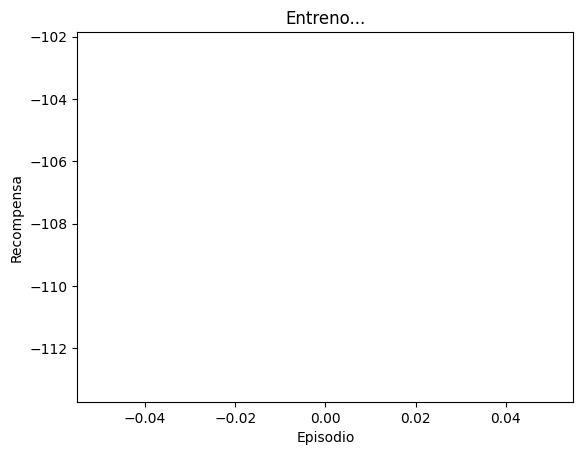

Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada:

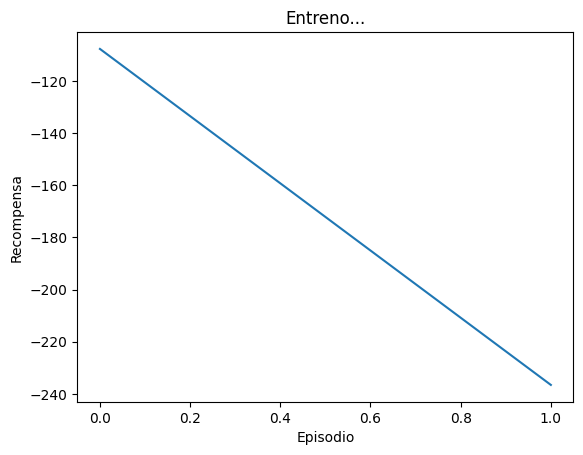

Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada:

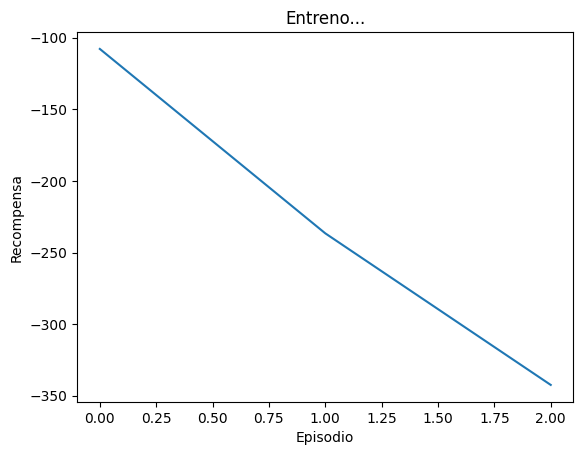

Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada:

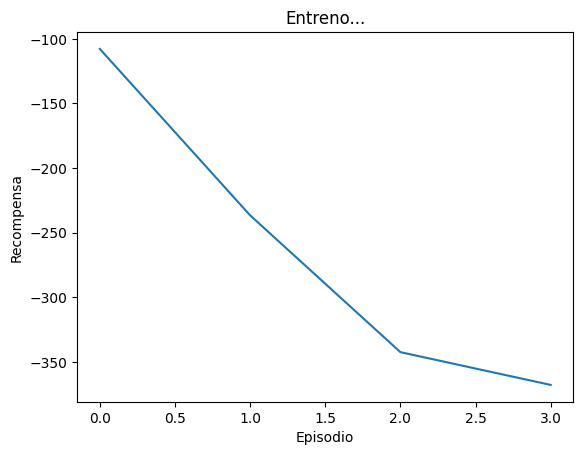

Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada:

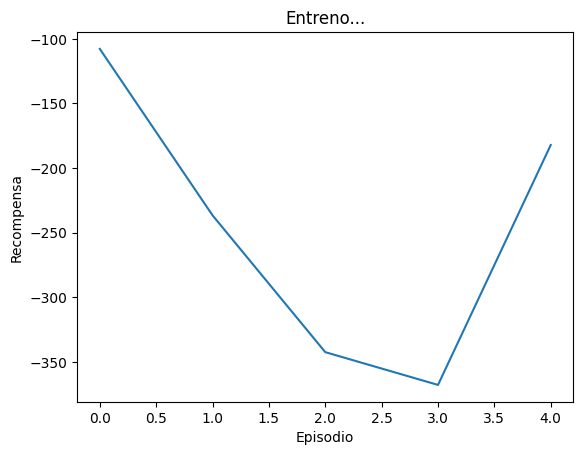

Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada:

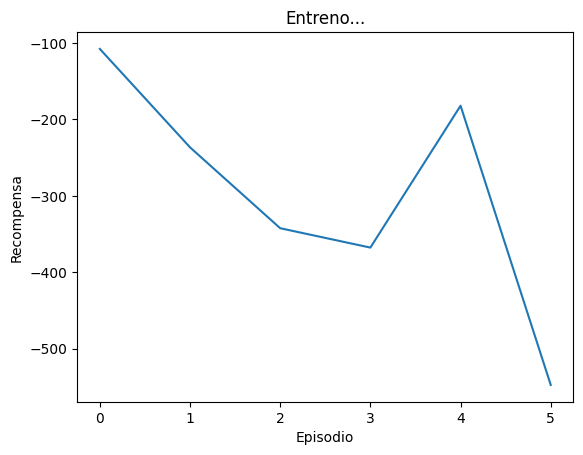

Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada:

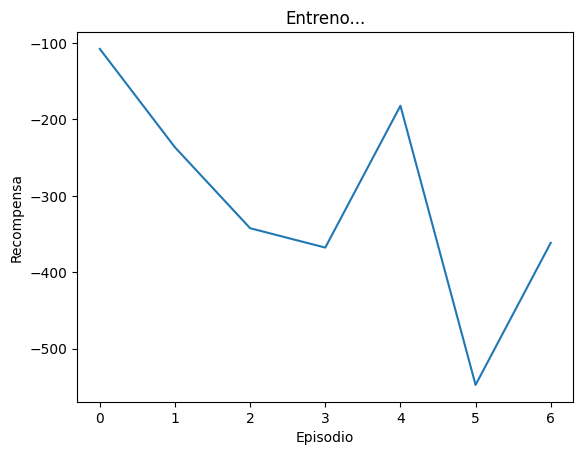

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada:

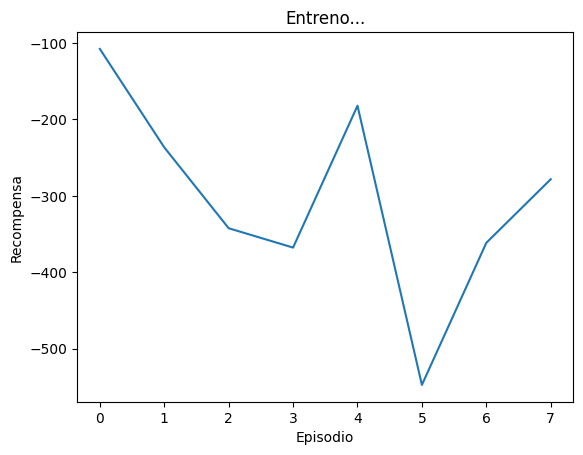

Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada:

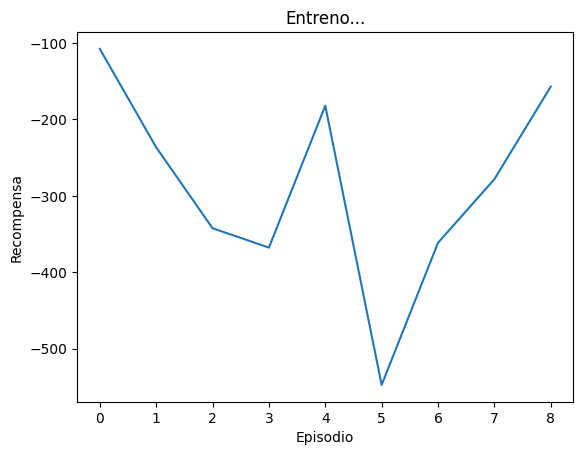

Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

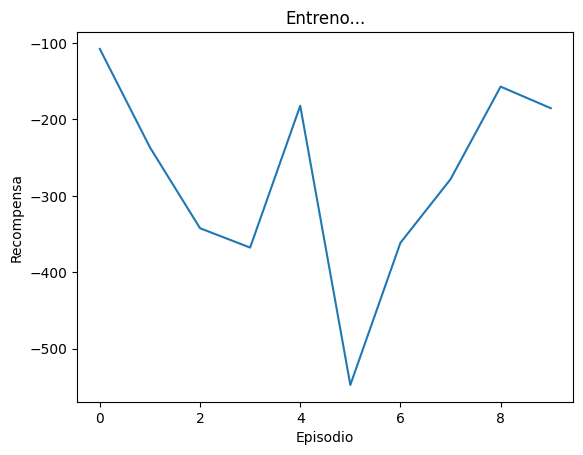

Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

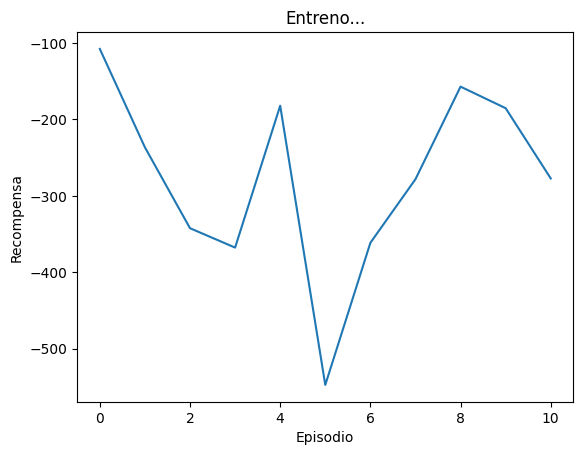

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada:

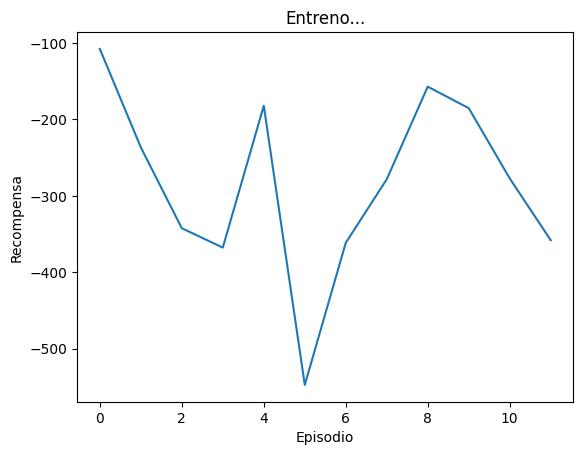

Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

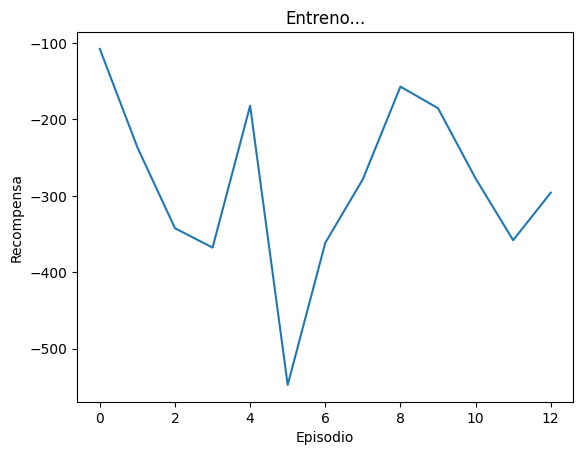

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada:

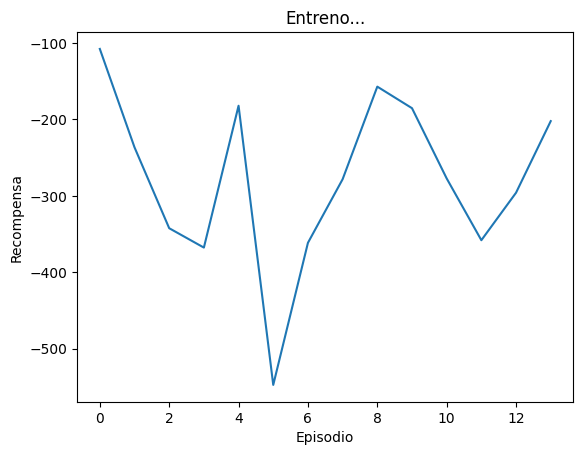

Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

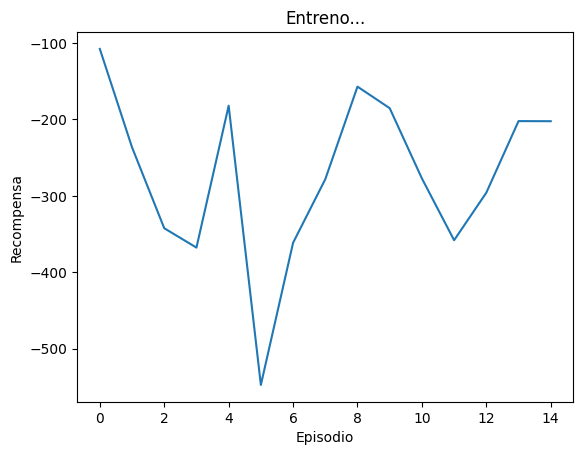

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada:

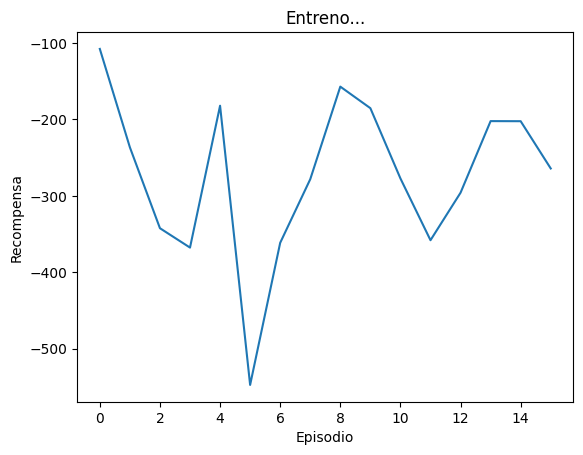

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

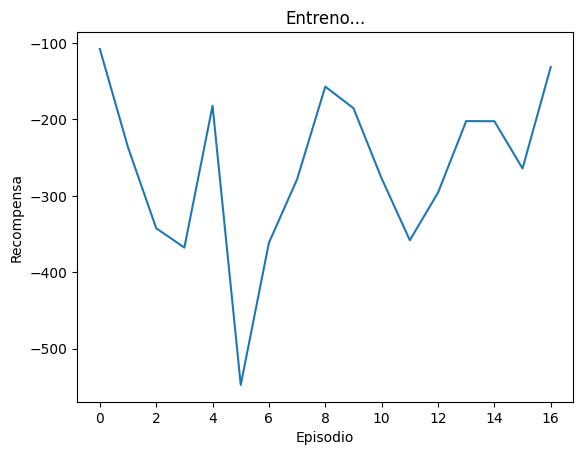

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada:

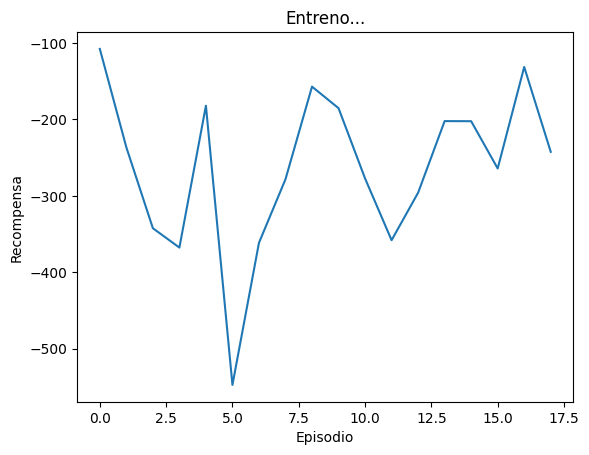

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada:

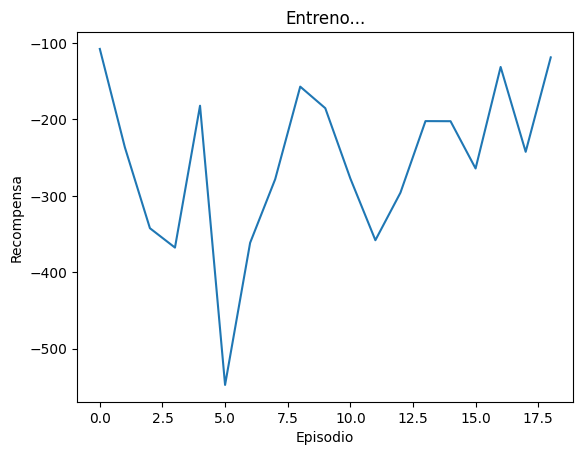

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada:

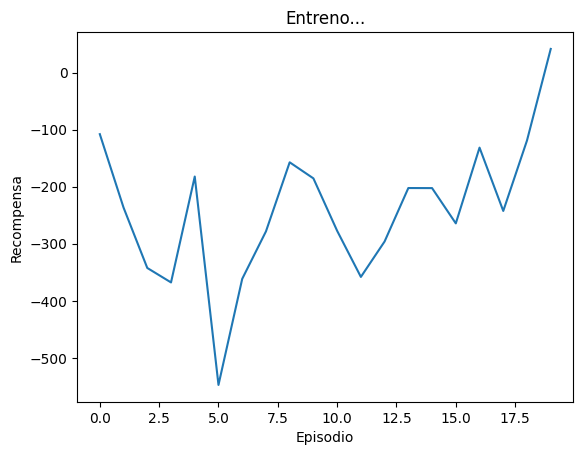

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada:

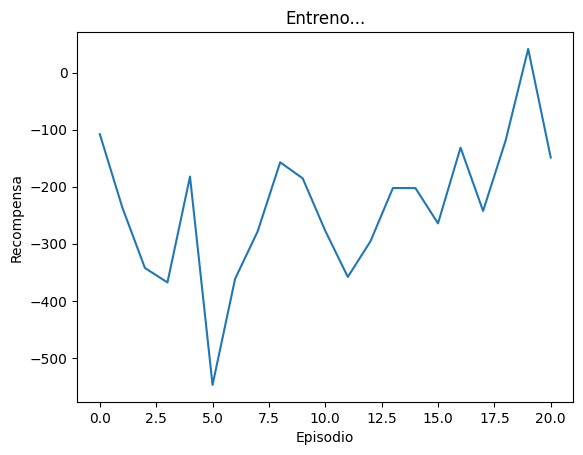

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada:

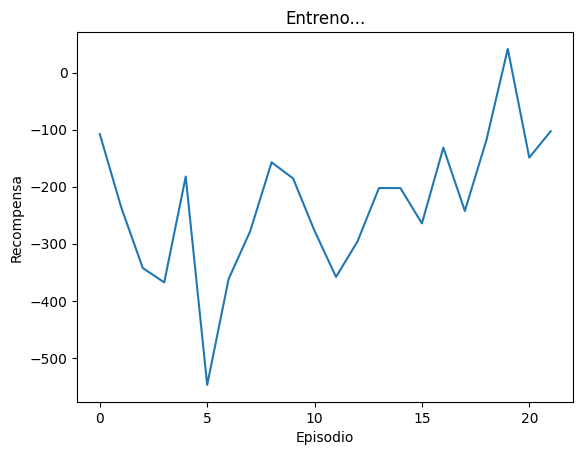

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

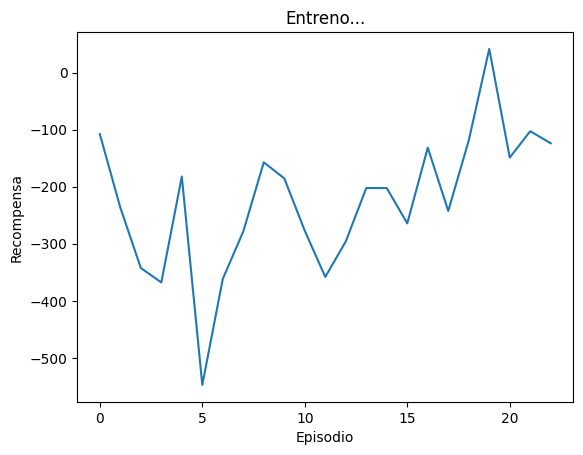

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

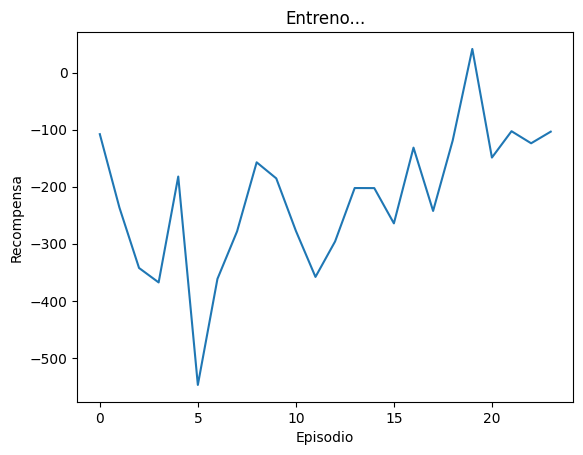

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

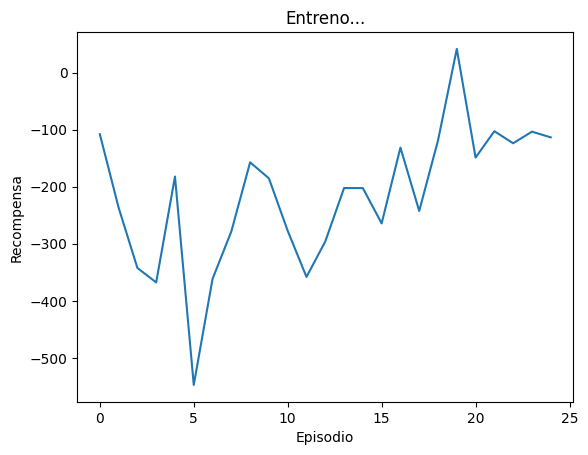

Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

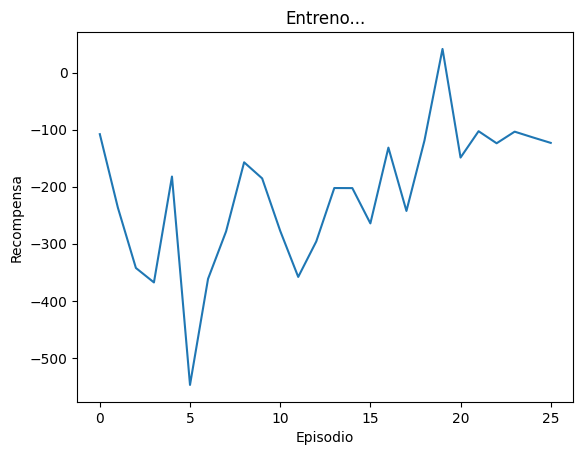

Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada:

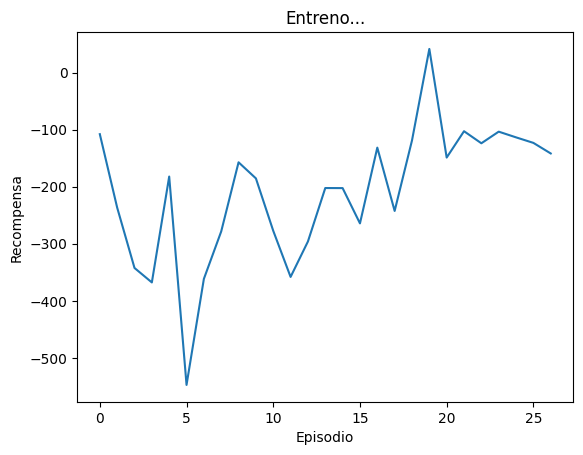

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada:

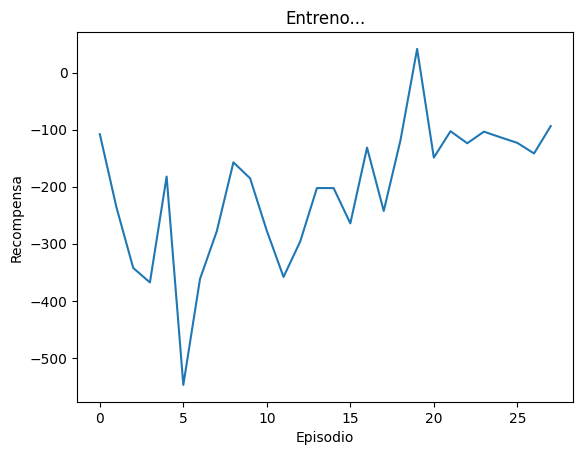

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada:

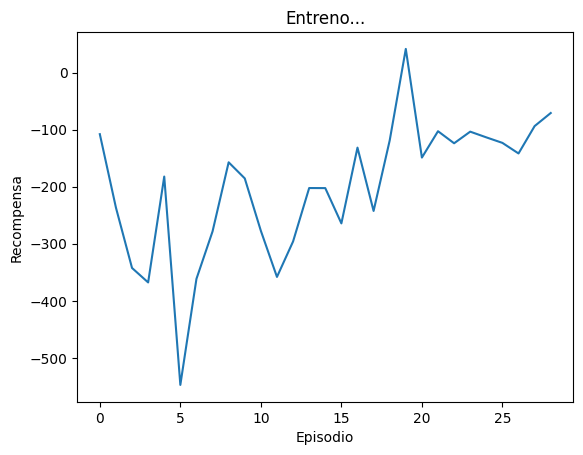

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada:

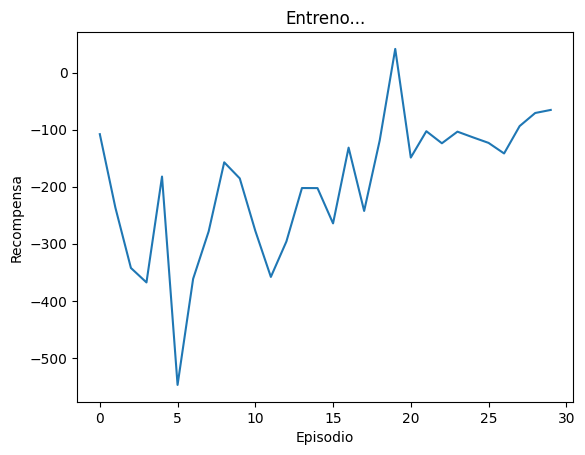

Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

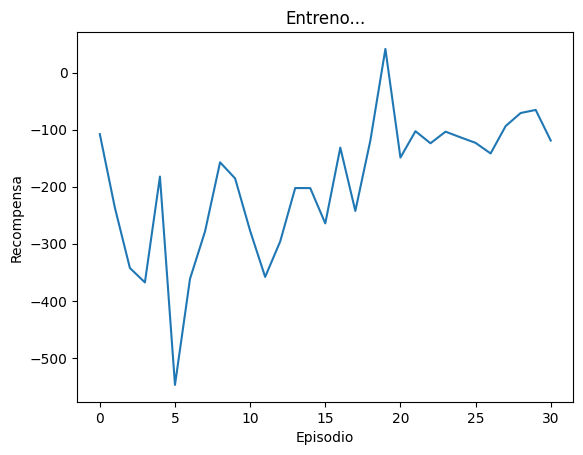

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

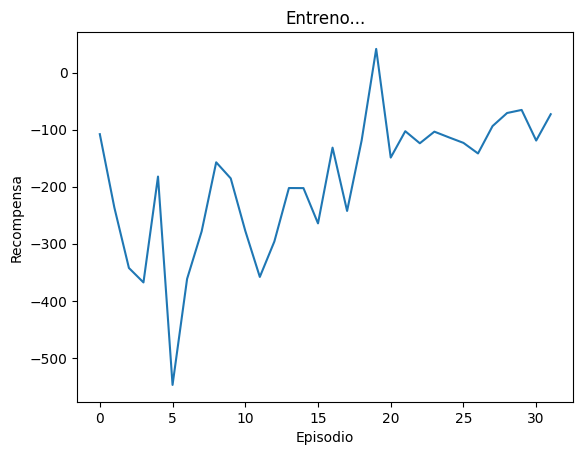

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada:

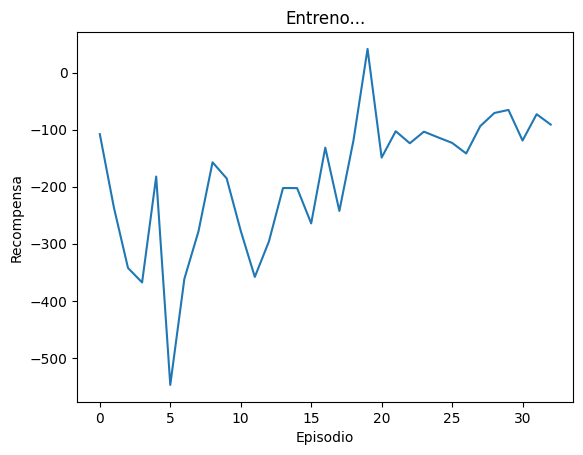

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada:

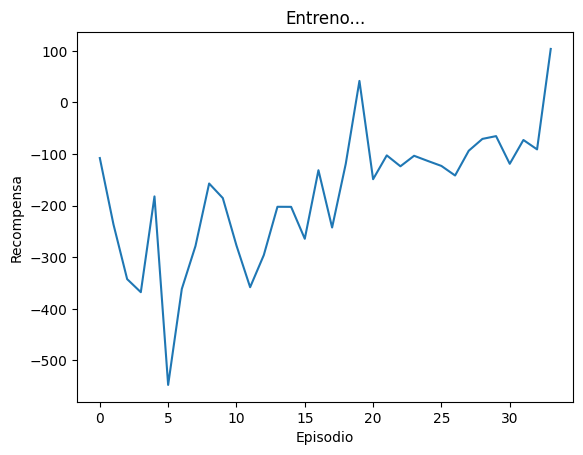

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

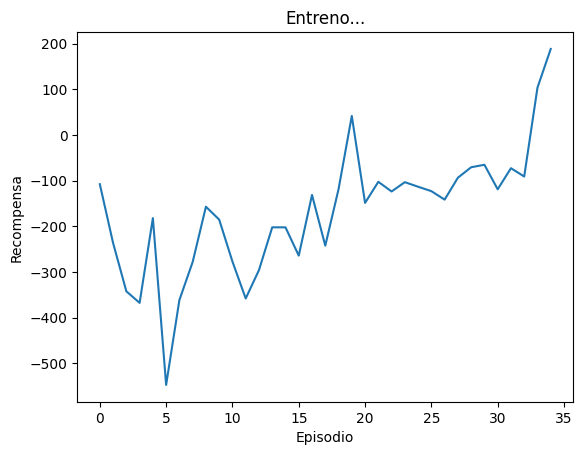

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

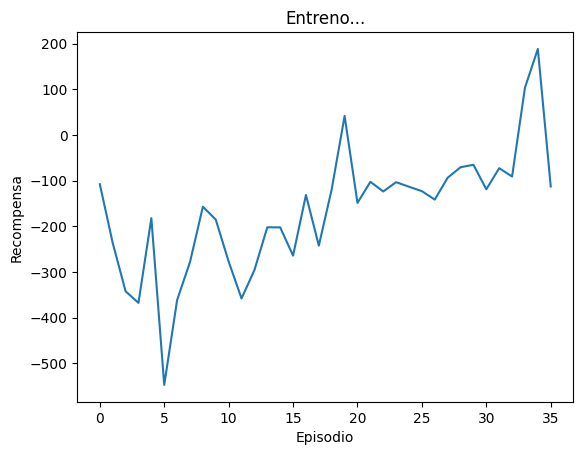

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

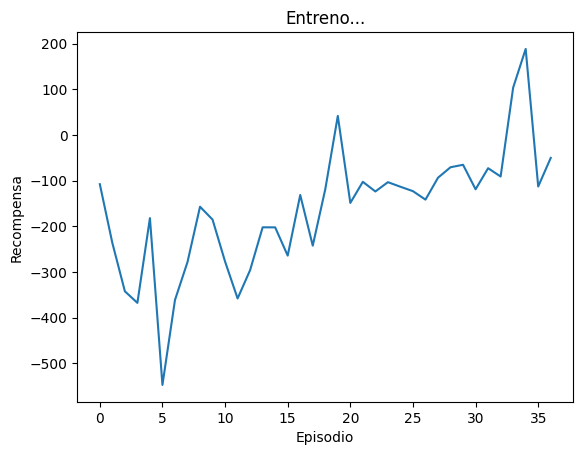

Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

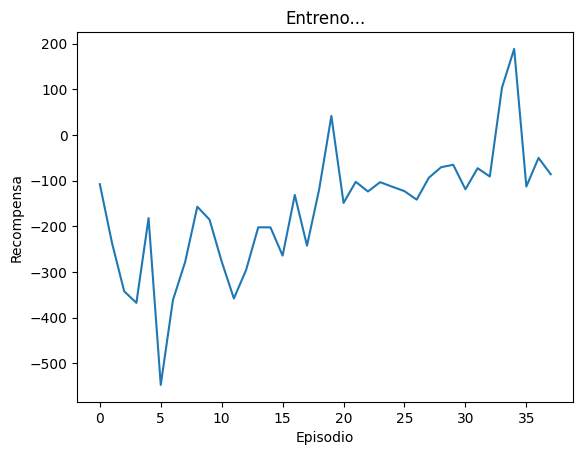

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

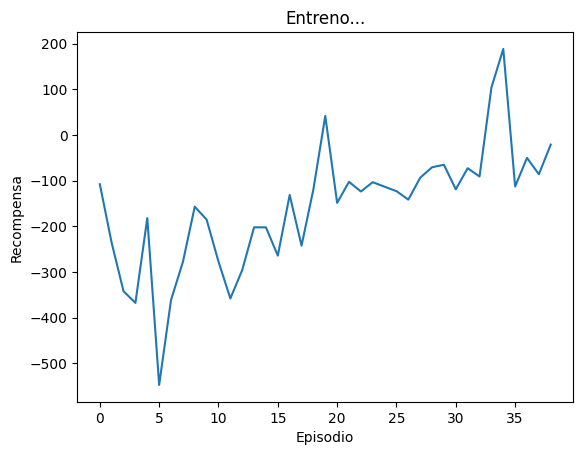

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

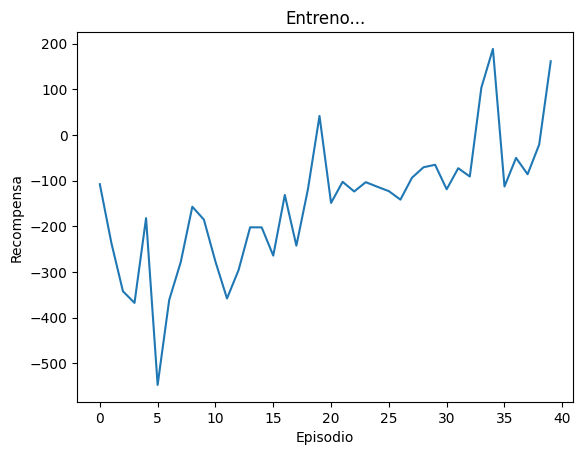

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

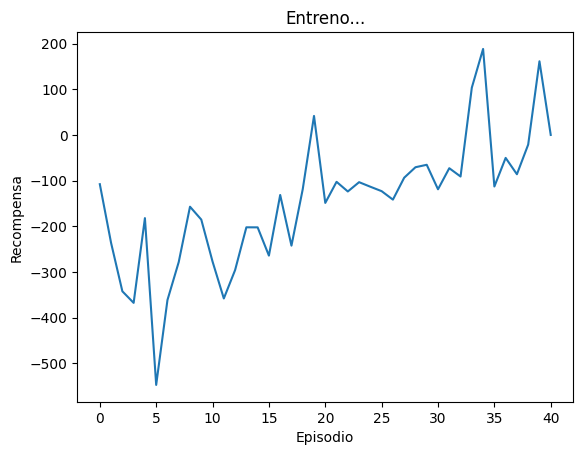

Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

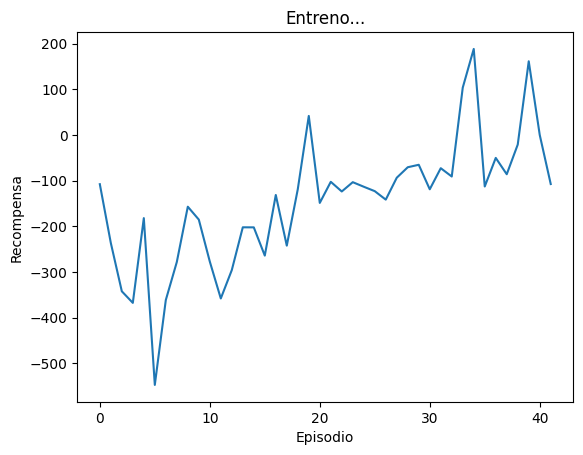

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

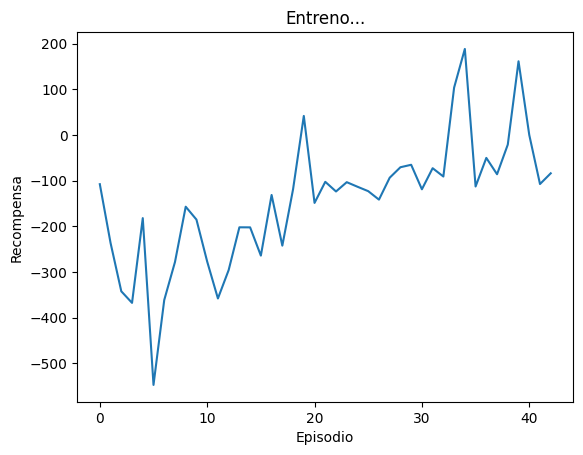

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada:

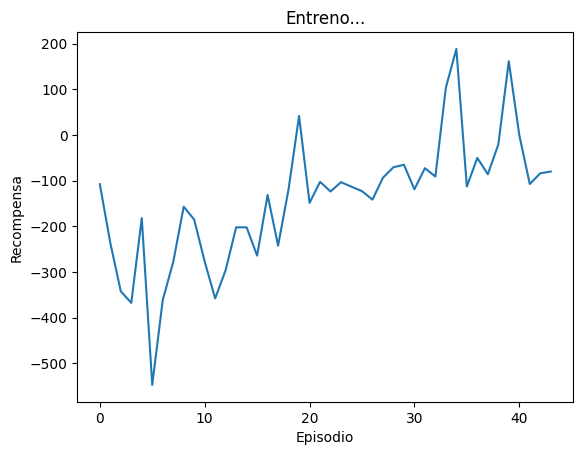

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

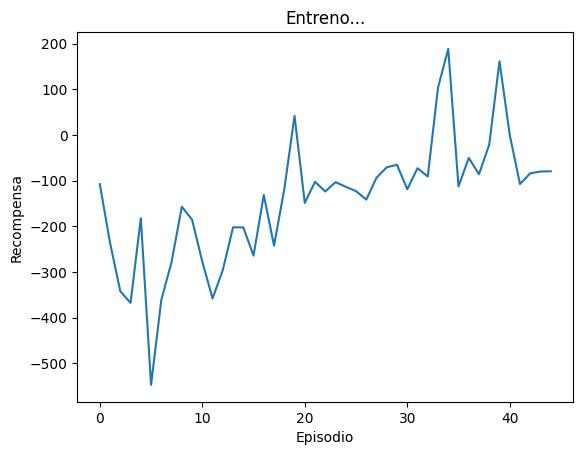

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

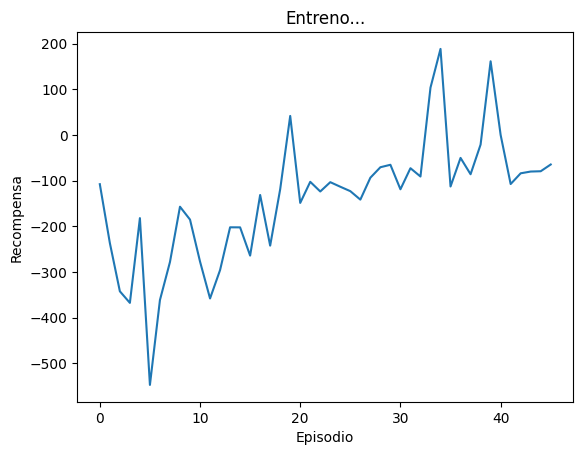

Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

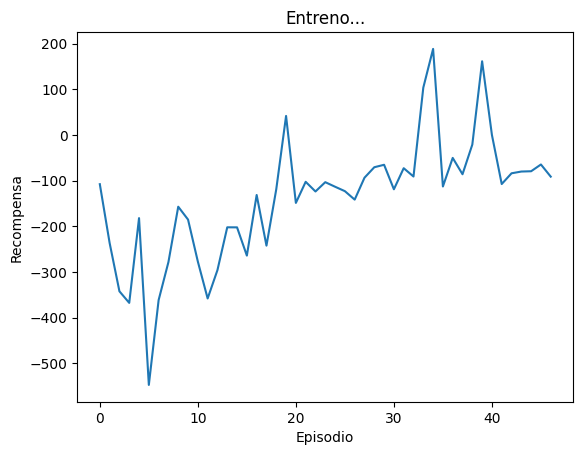

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

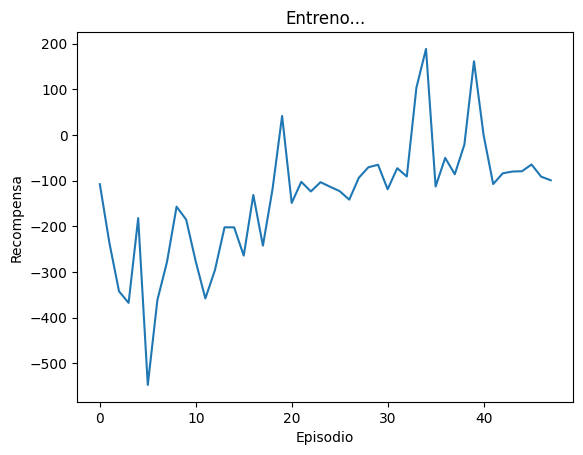

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

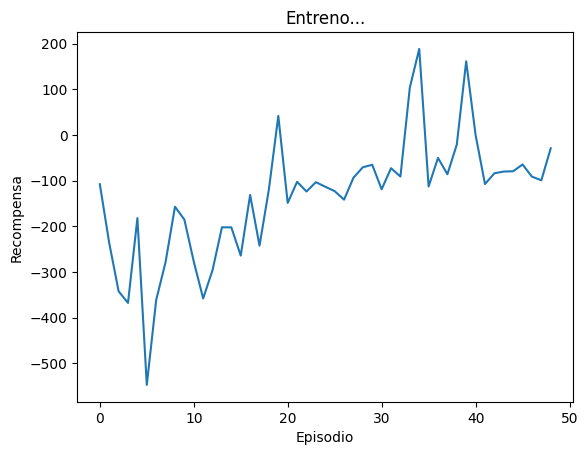

Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada:

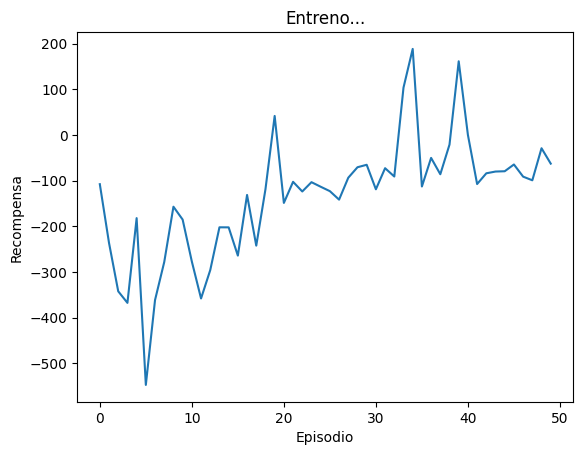

Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

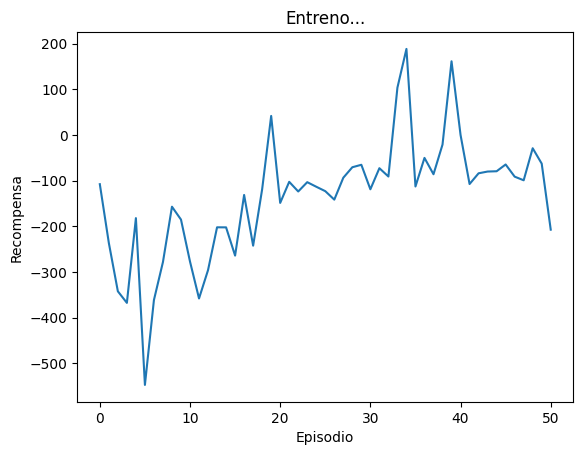

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada:

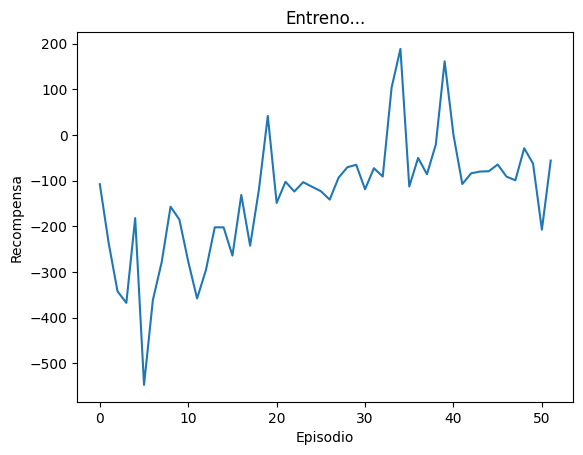

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada:

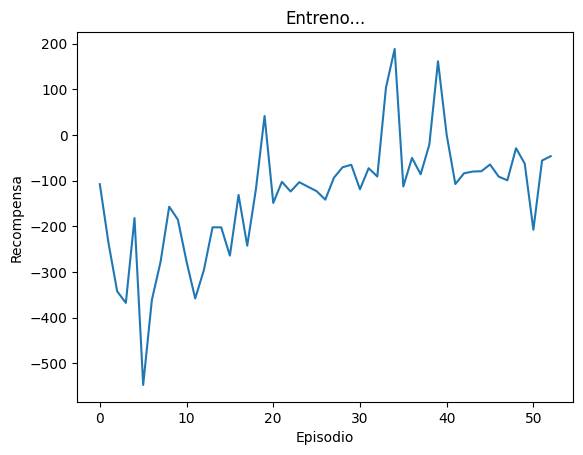

Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada:

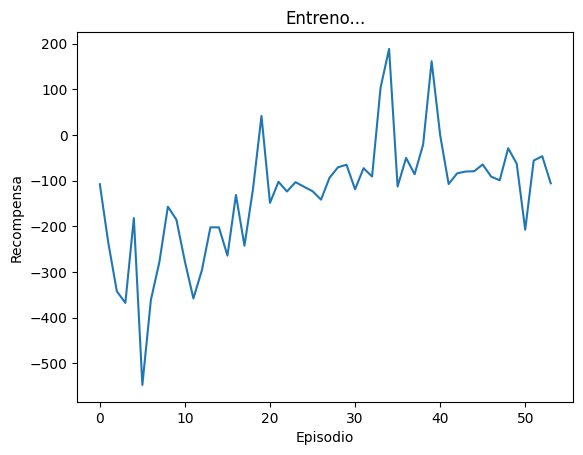

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada:

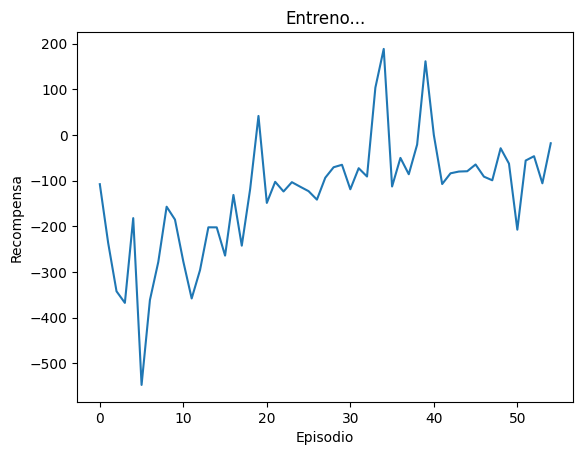

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

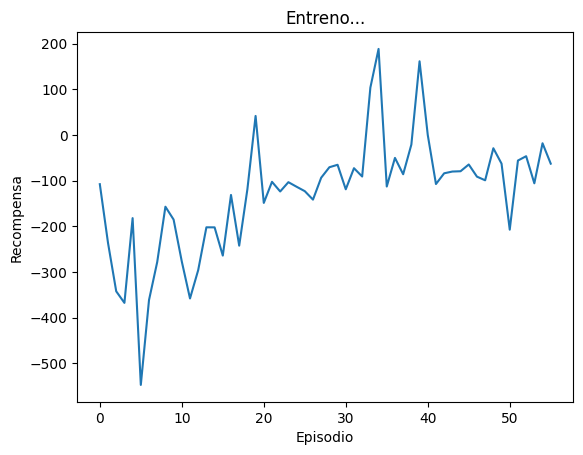

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

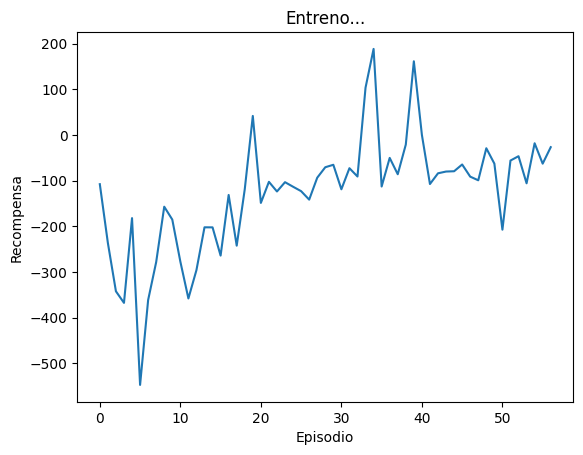

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada:

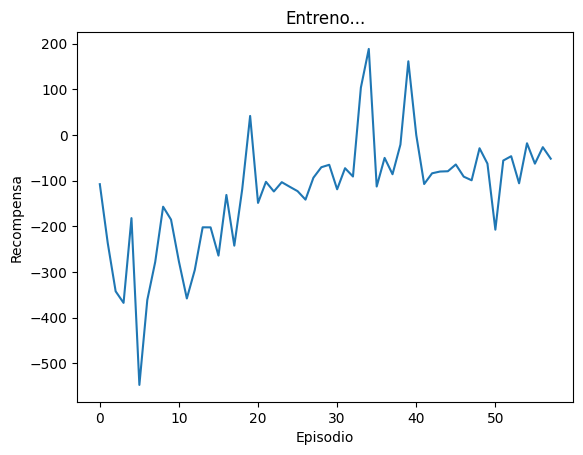

Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

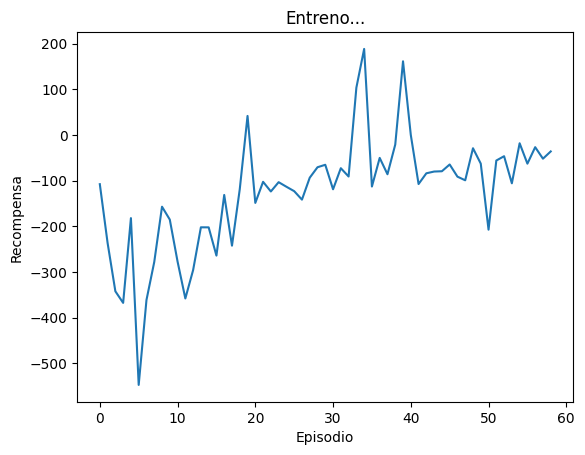

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

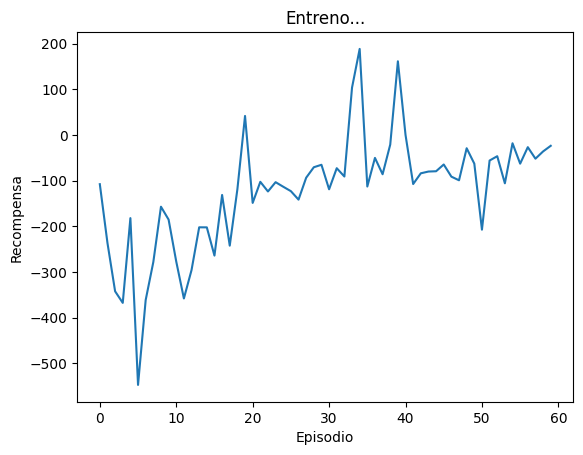

Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

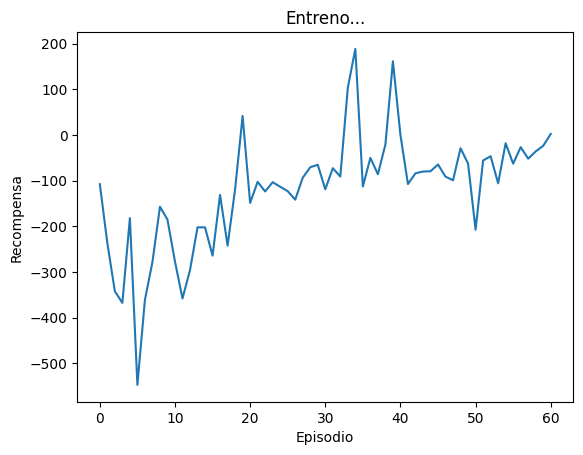

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada:

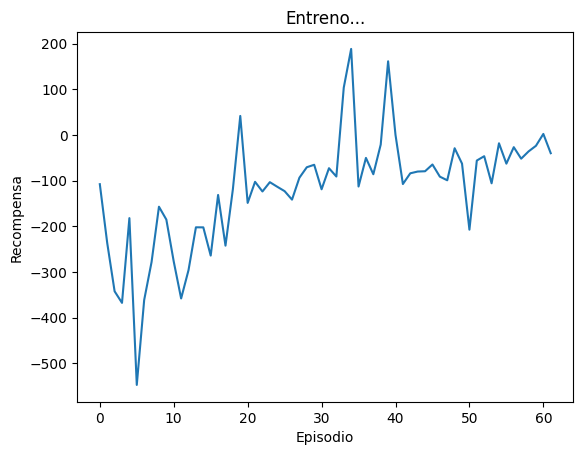

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

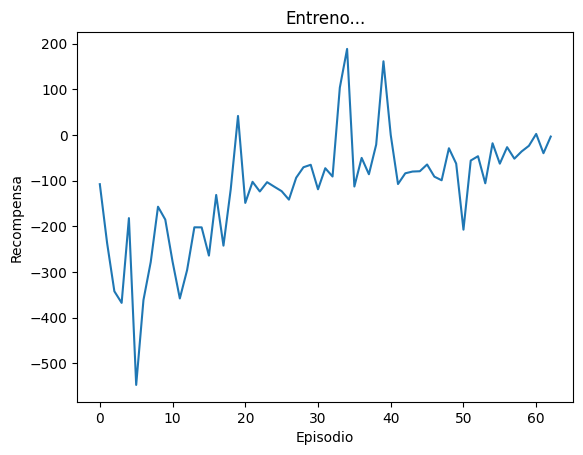

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

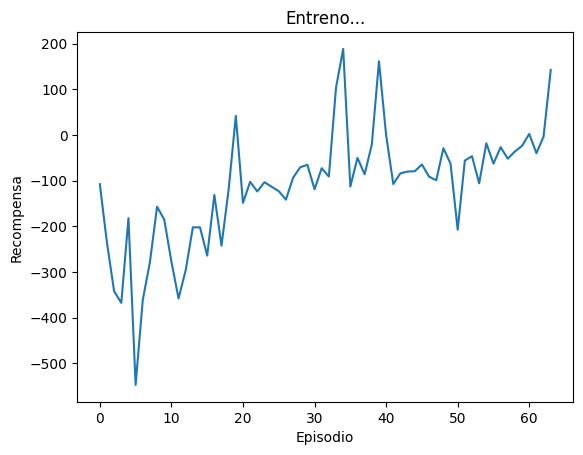

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

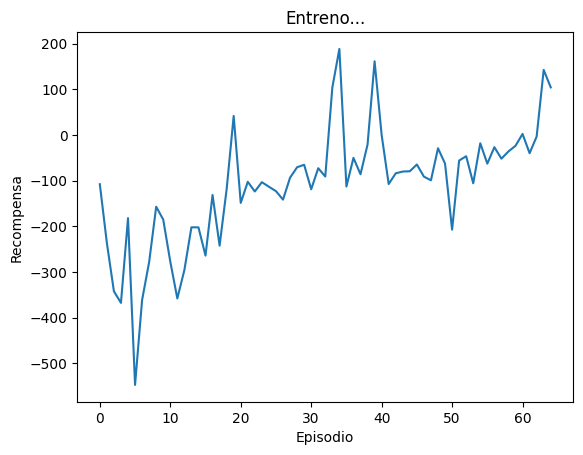

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

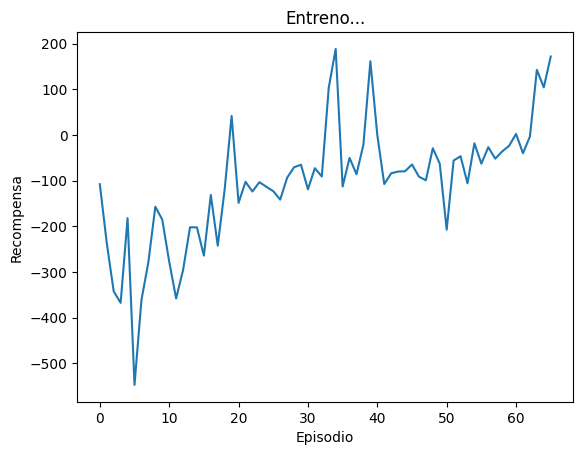

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

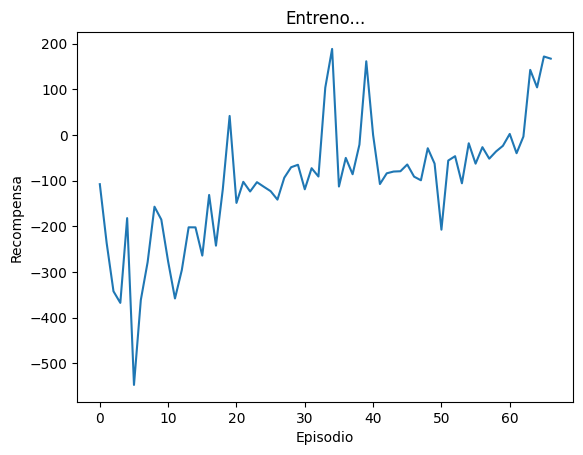

Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

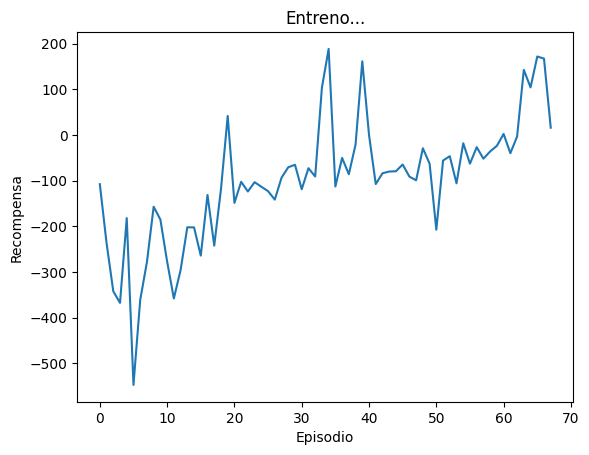

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

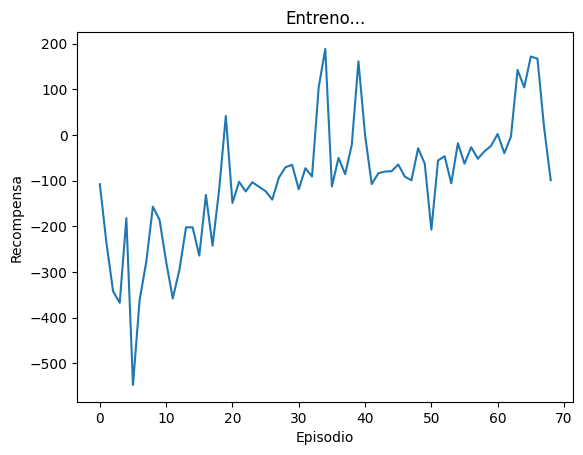

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada:

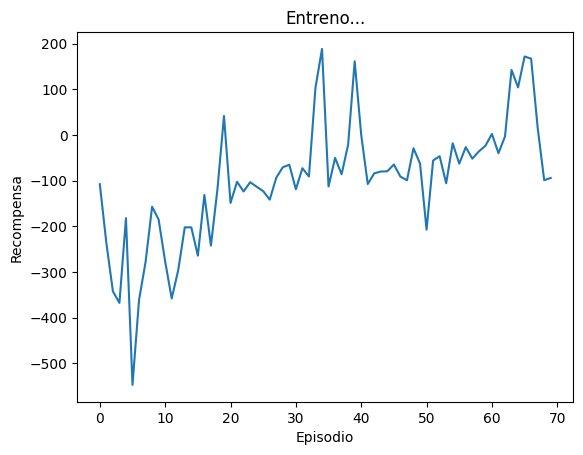

Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

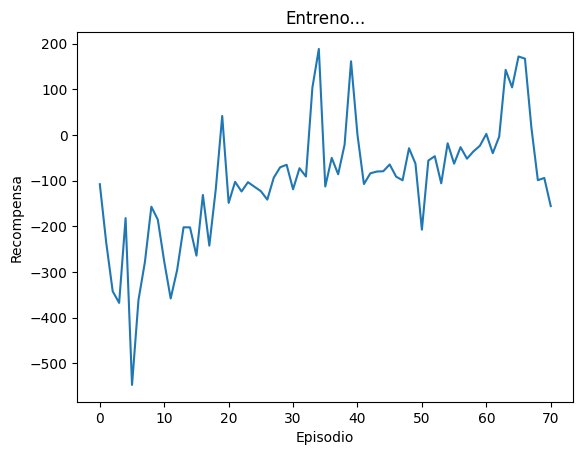

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

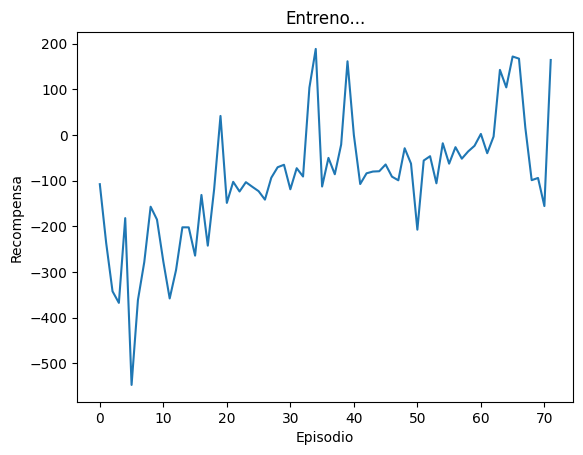

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada:

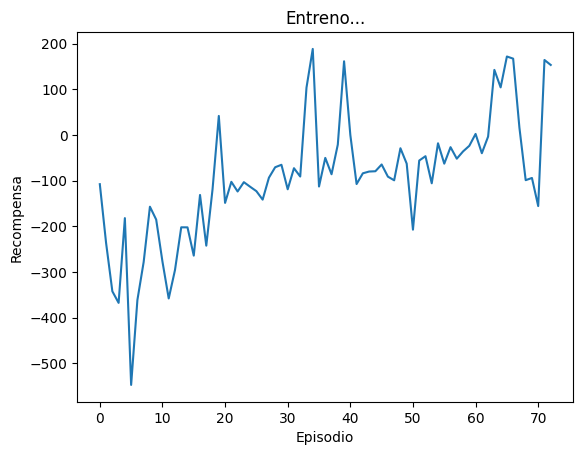

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada:

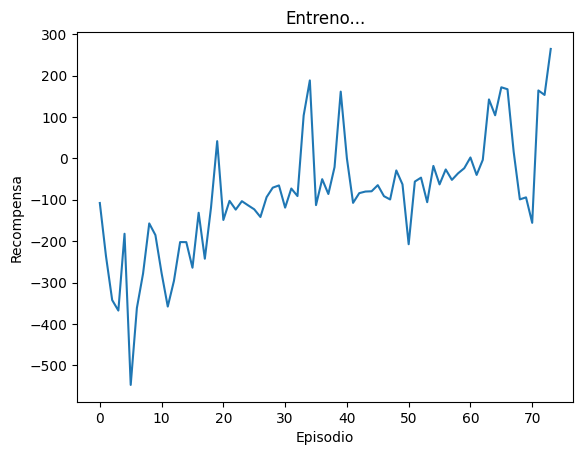

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada:

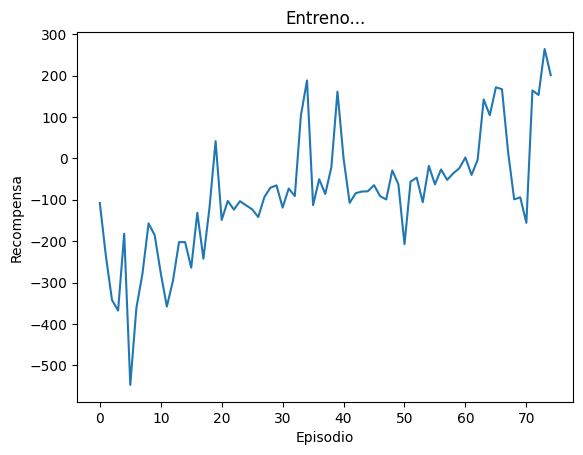

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

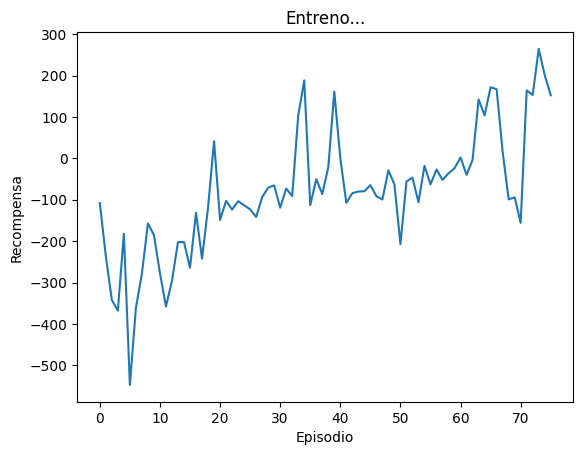

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada:

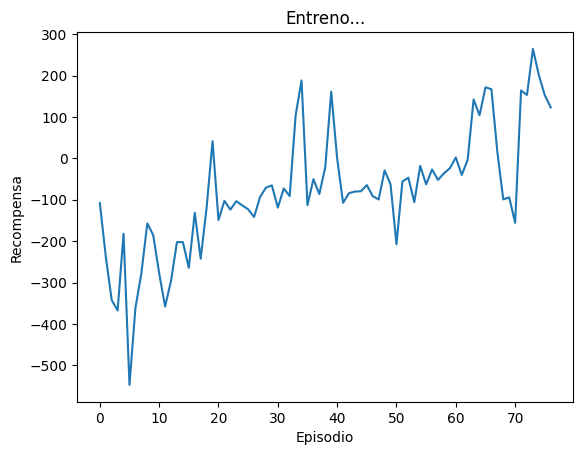

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

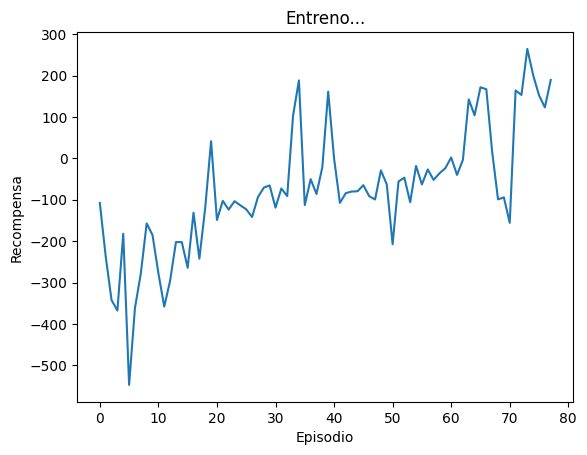

Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

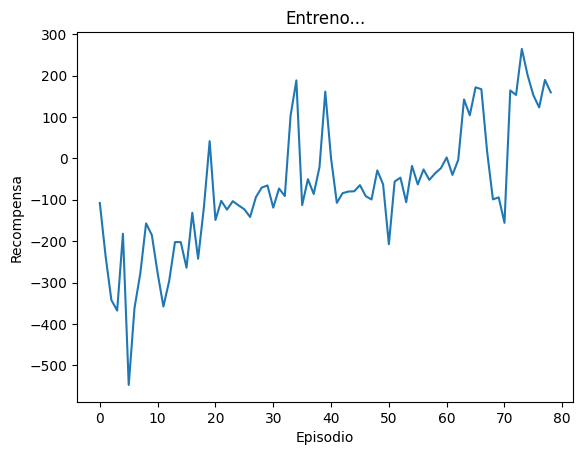

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

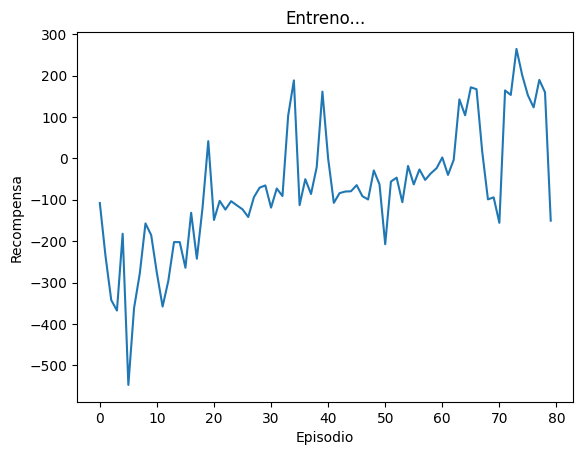

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

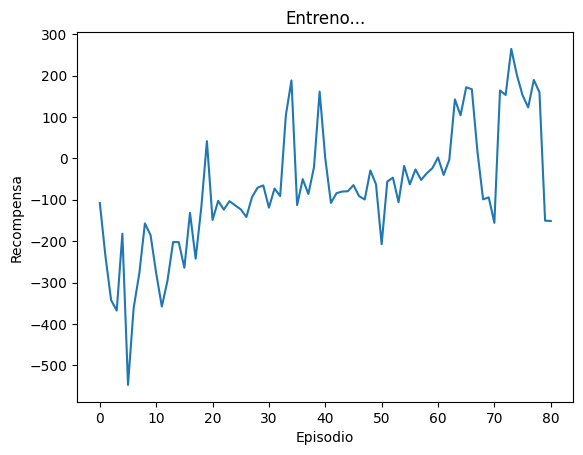

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

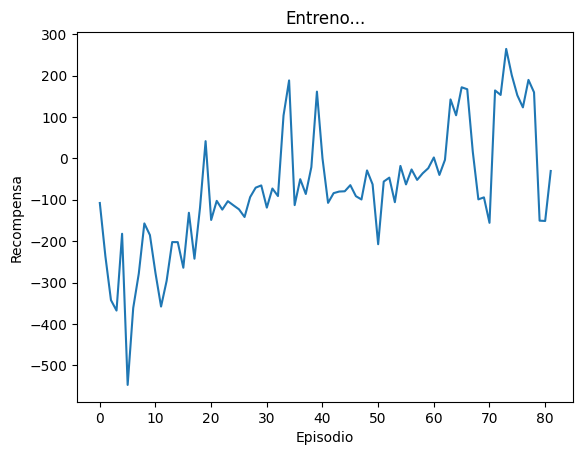

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

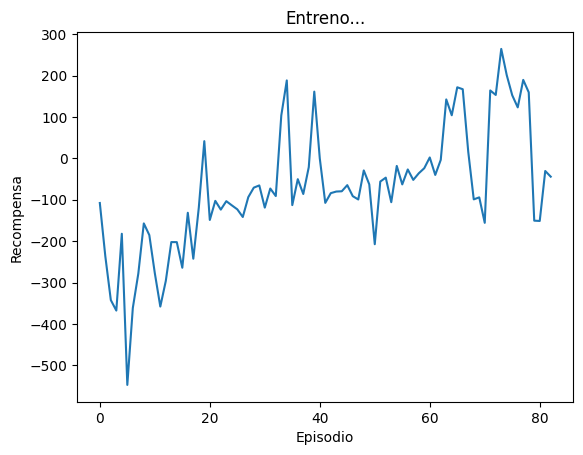

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

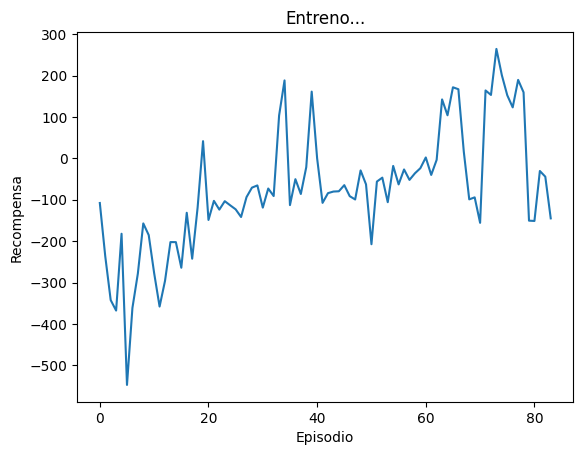

Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

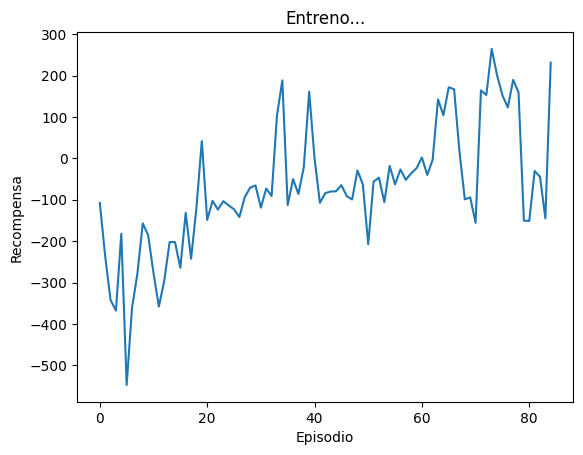

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

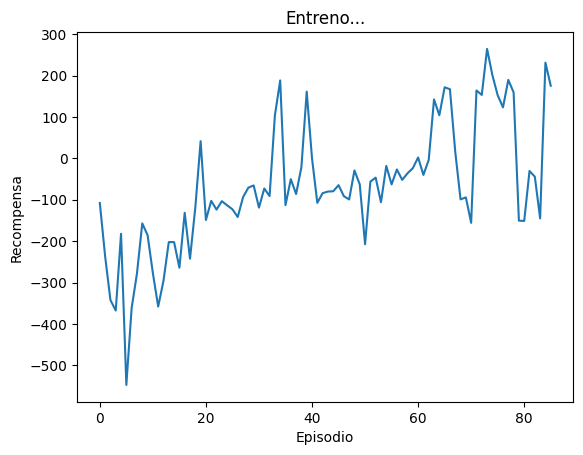

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

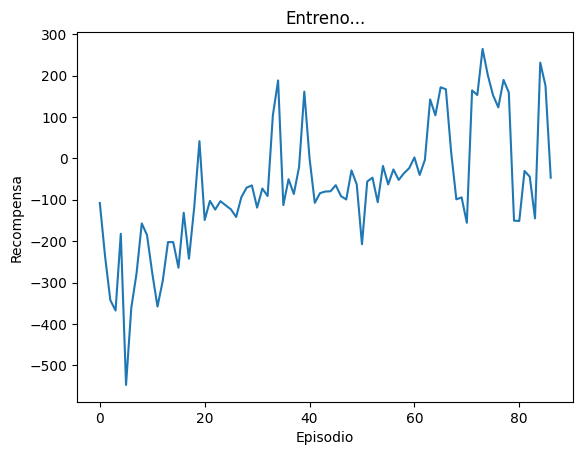

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

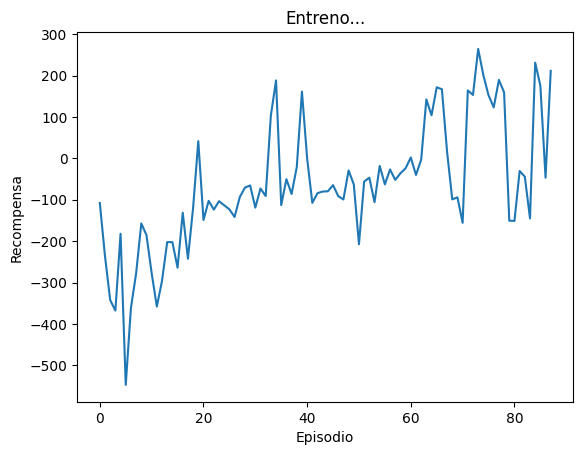

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada:

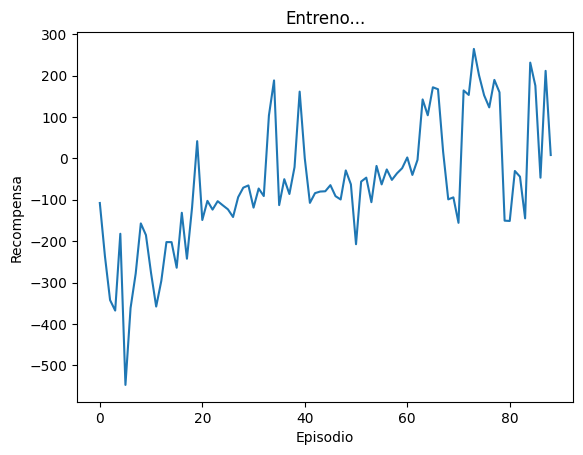

Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada:

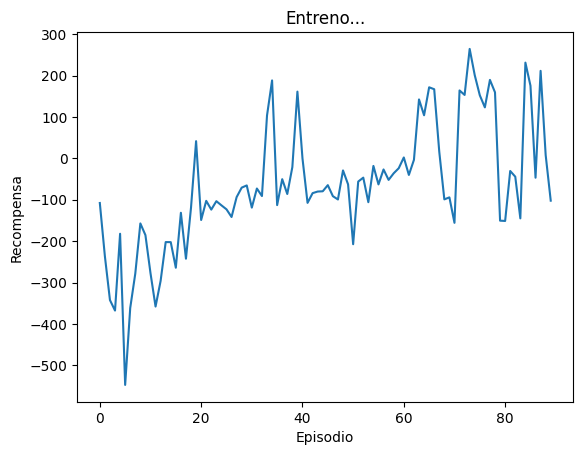

Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

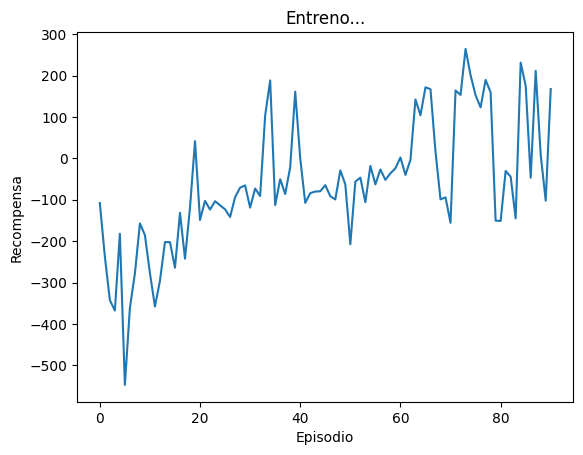

Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

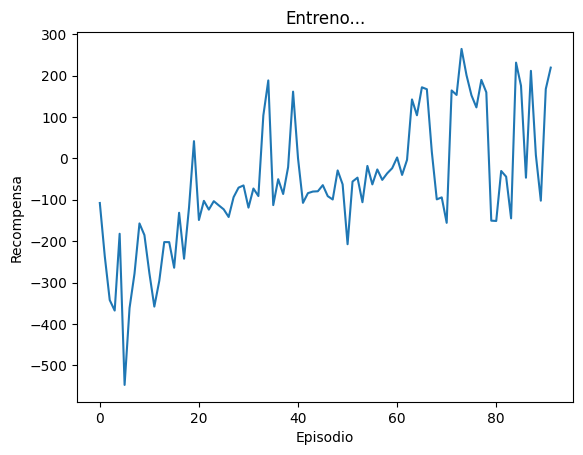

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada:

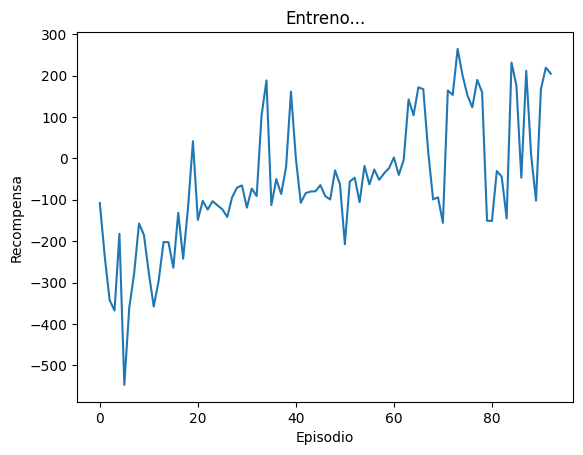

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

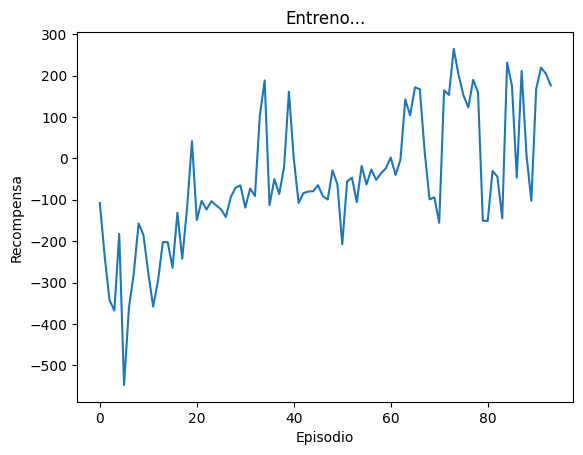

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

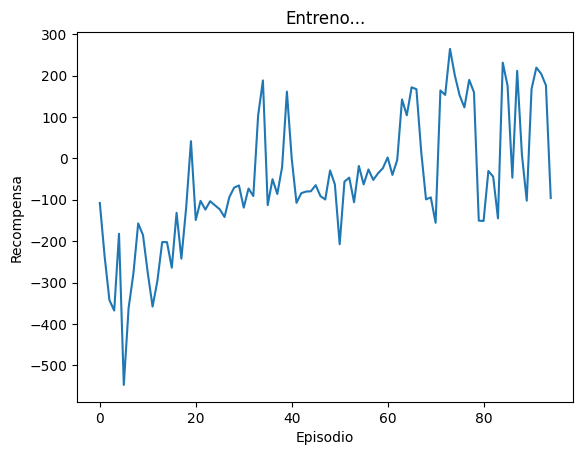

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

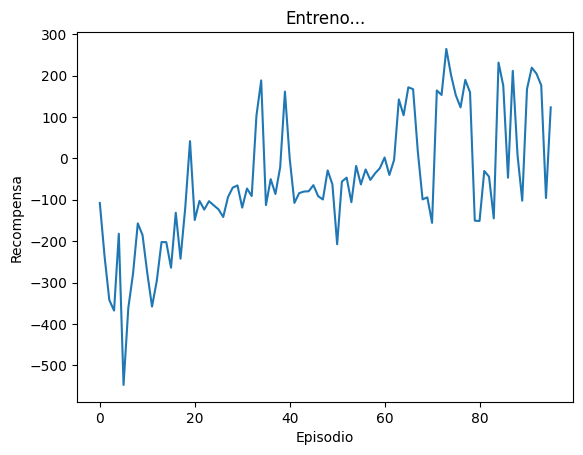

Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

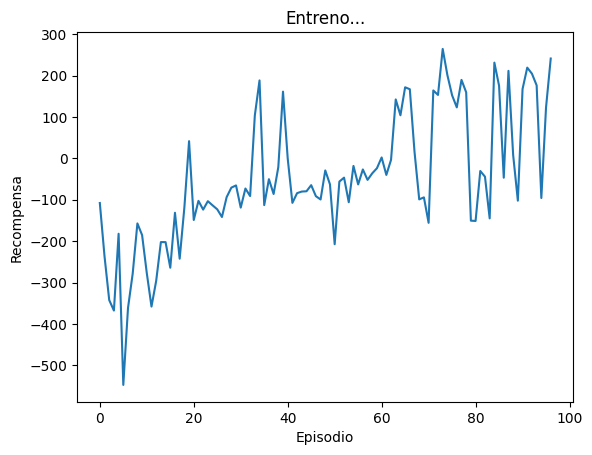

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

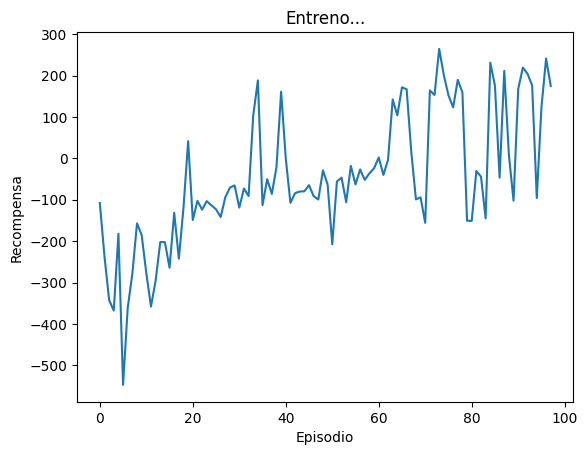

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada:

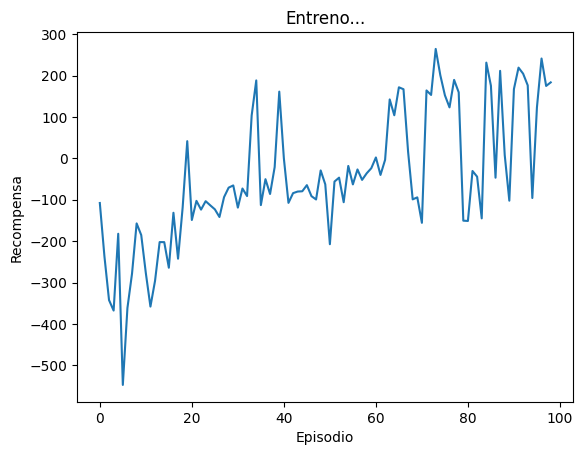

Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada:

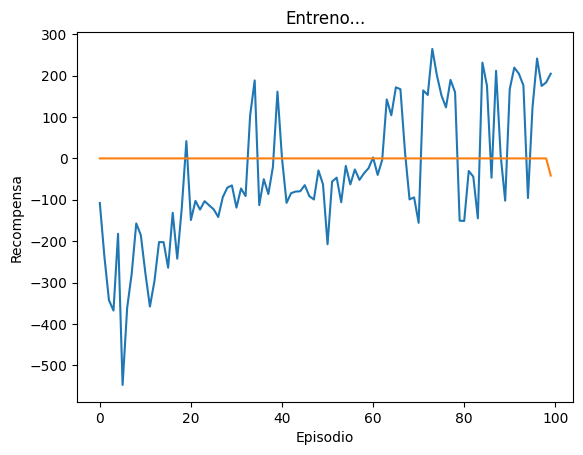

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada:

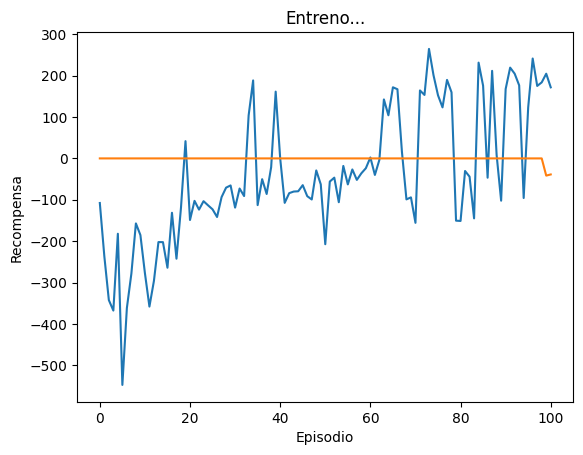

Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

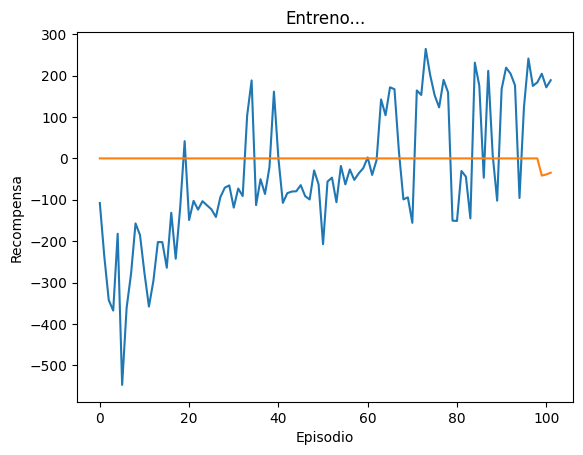

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

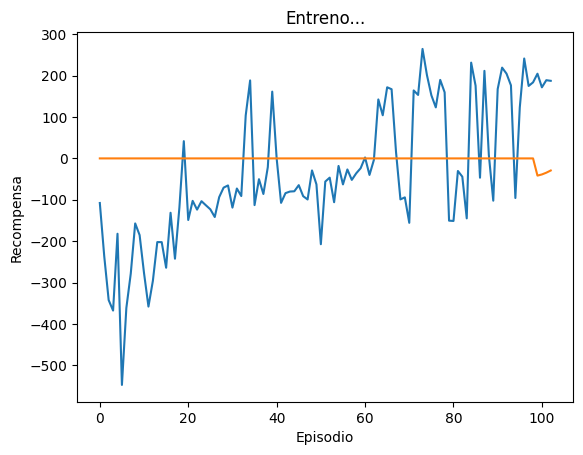

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada:

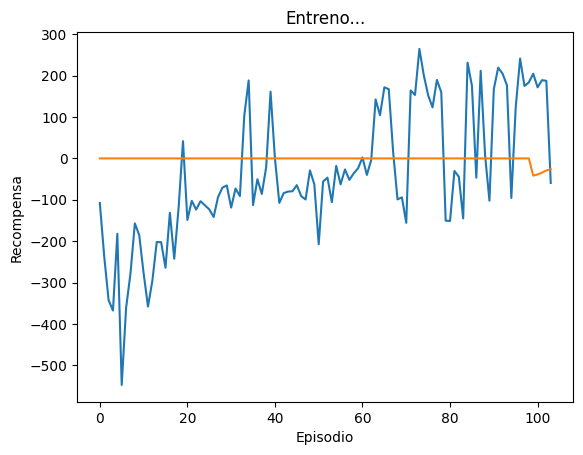

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

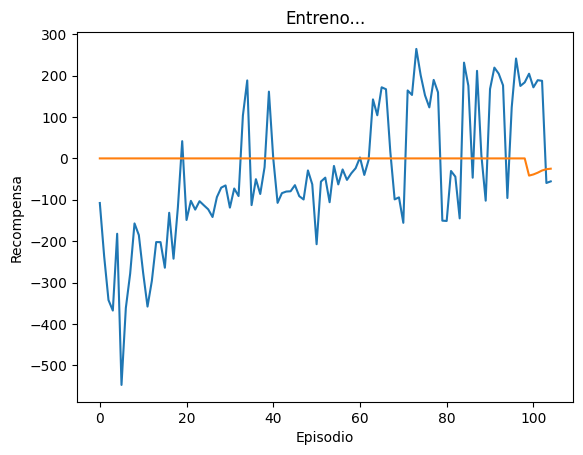

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada:

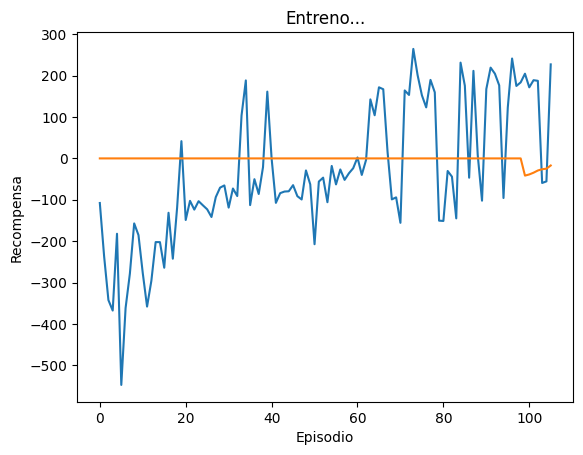

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

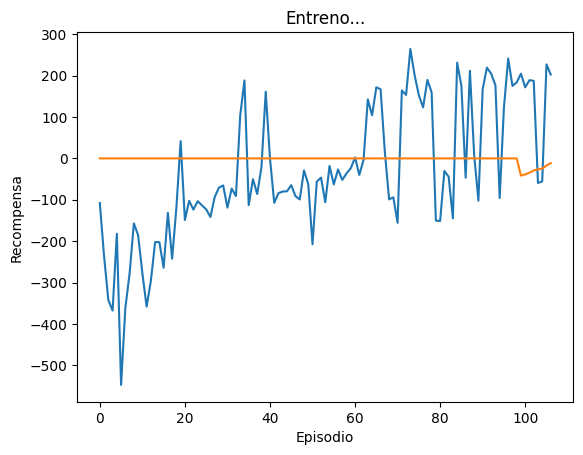

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

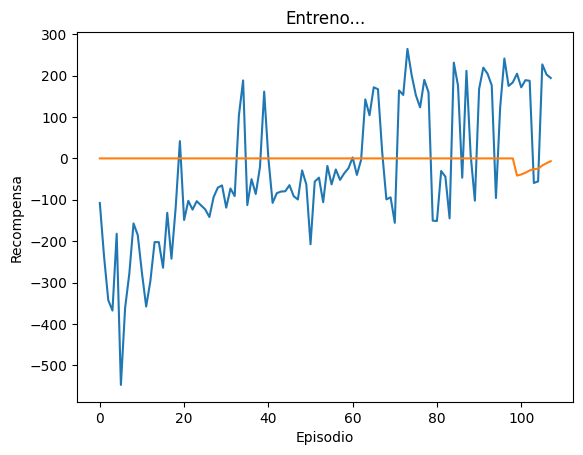

Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

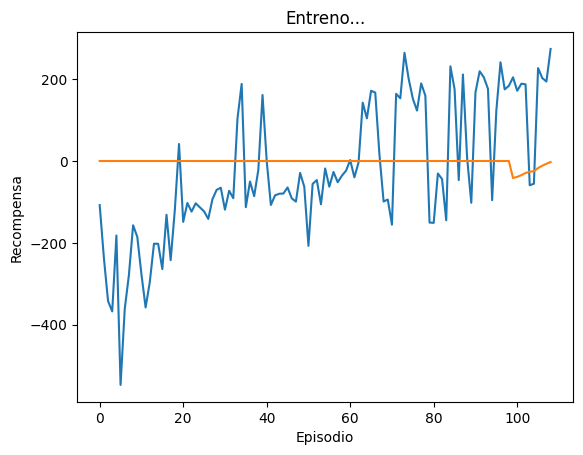

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada:

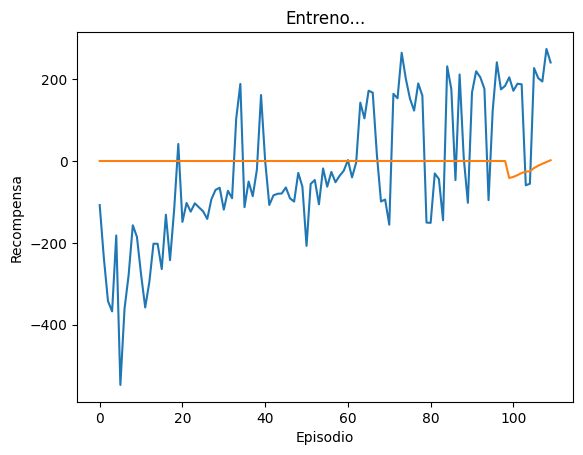

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

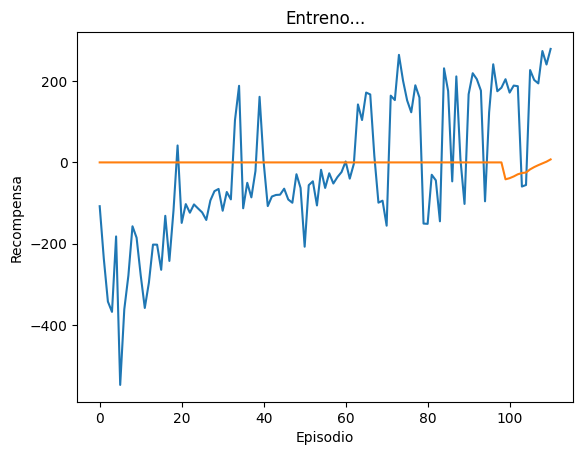

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

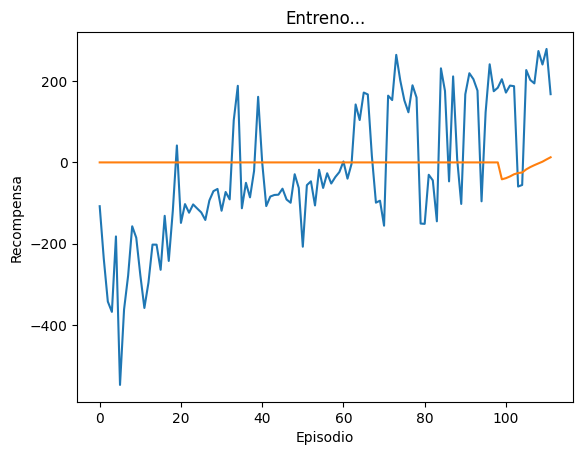

Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada:

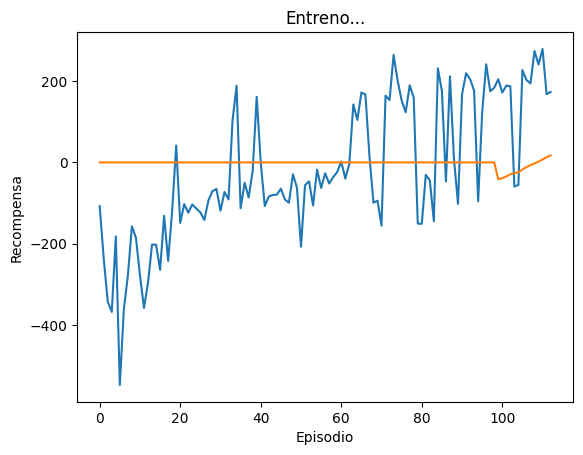

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

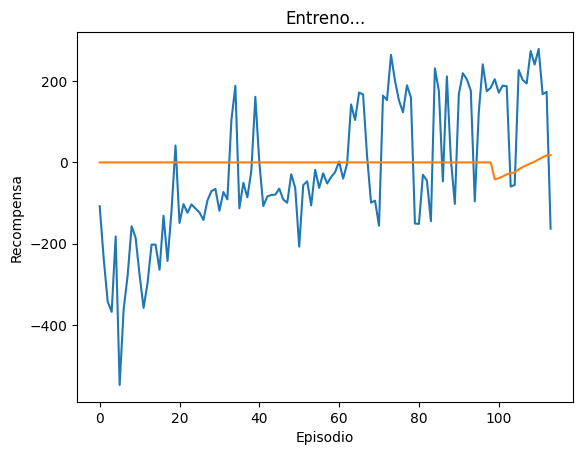

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

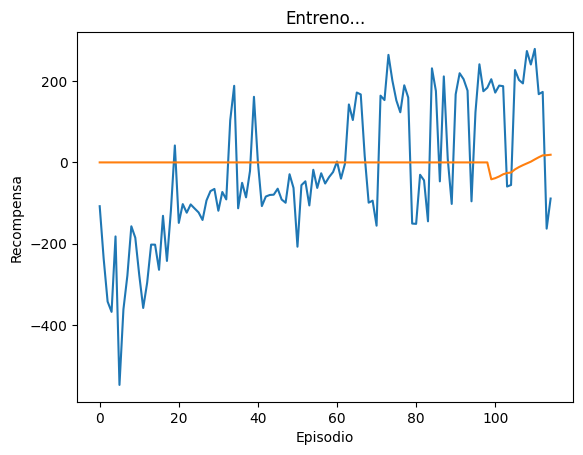

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada:

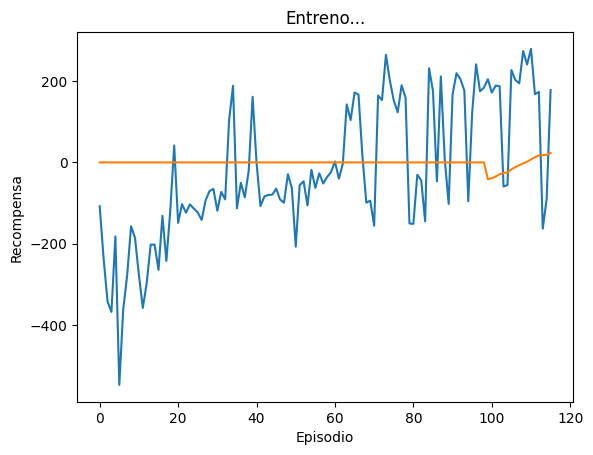

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

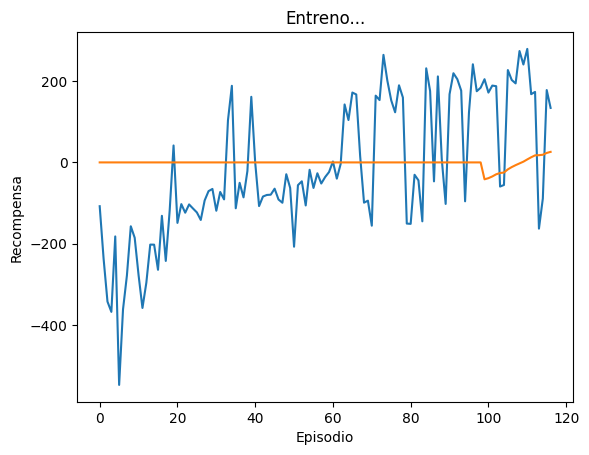

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

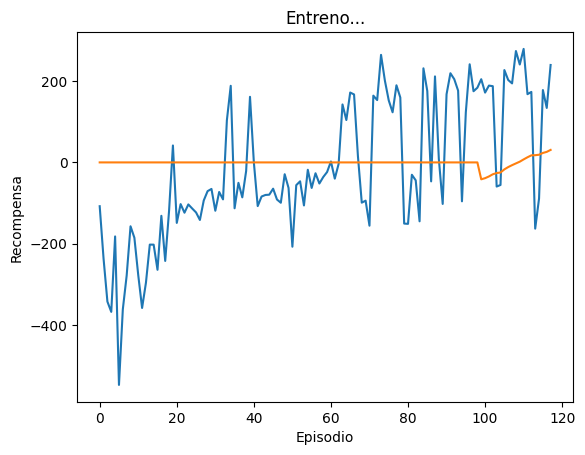

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

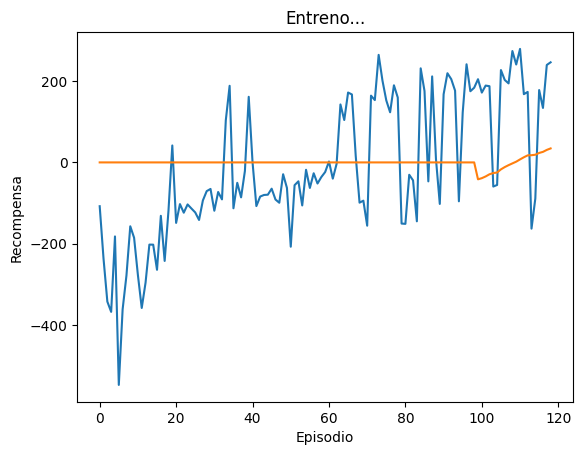

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada:

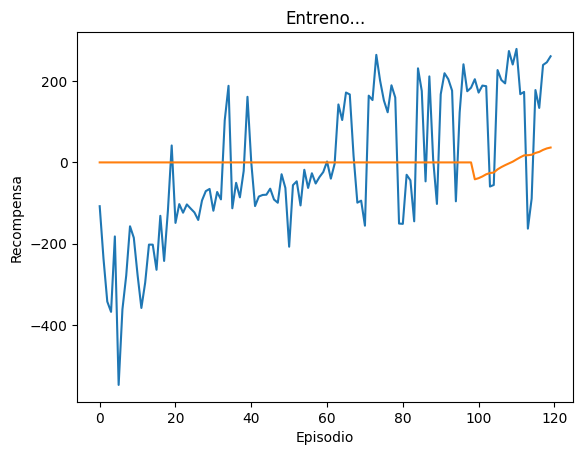

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada:

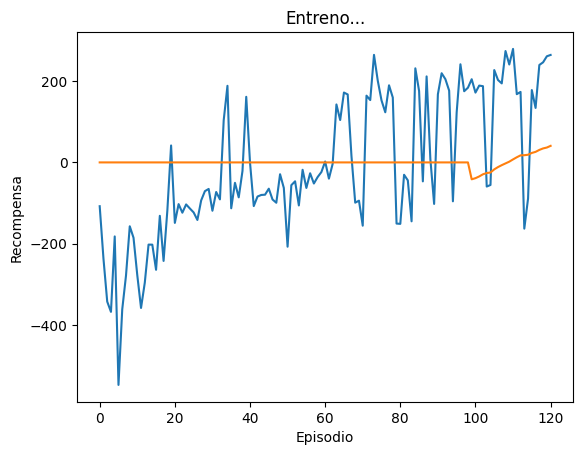

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

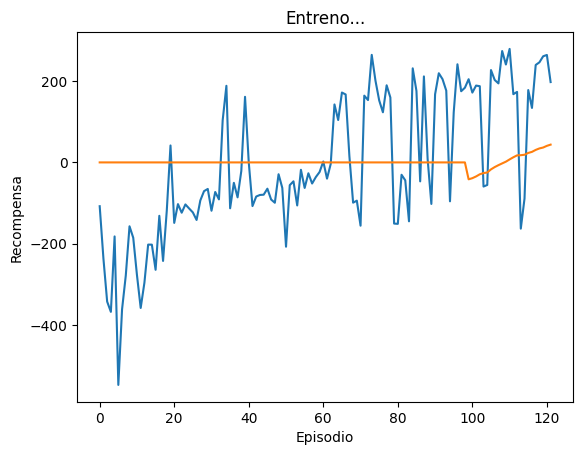

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

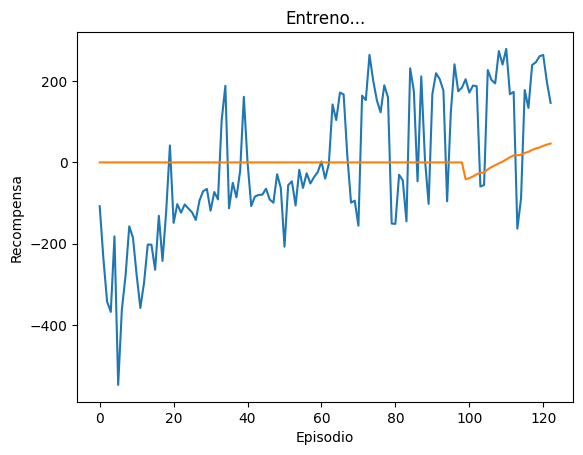

Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

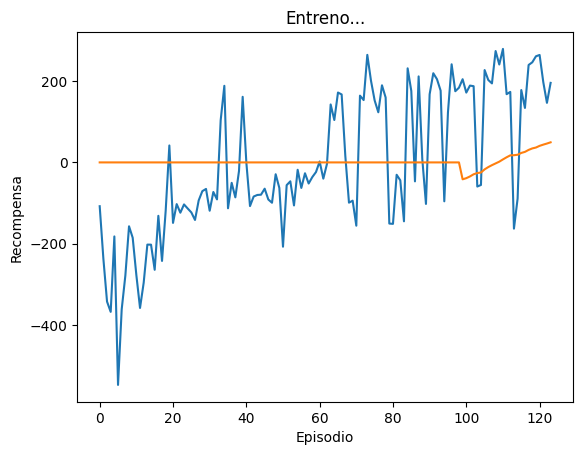

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

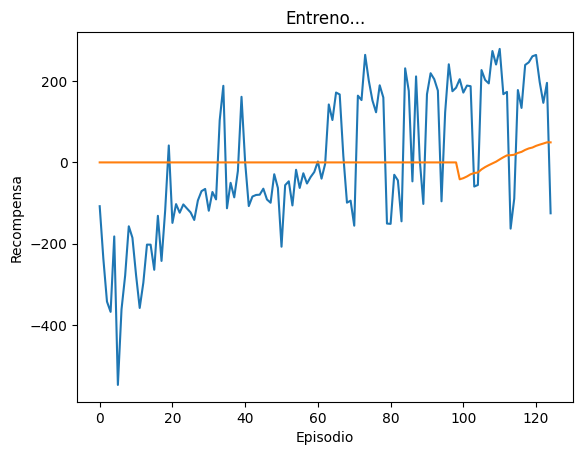

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

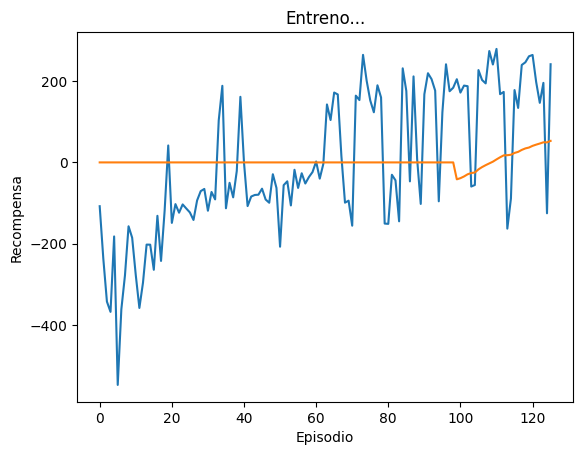

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada:

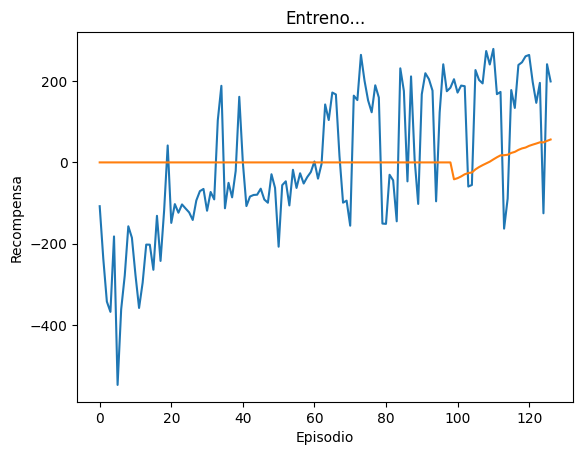

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

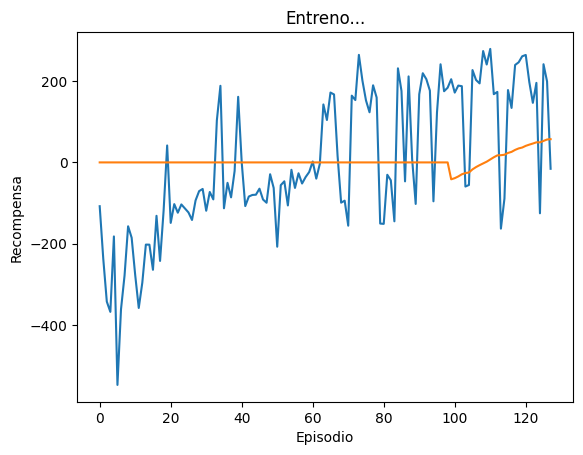

Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada:

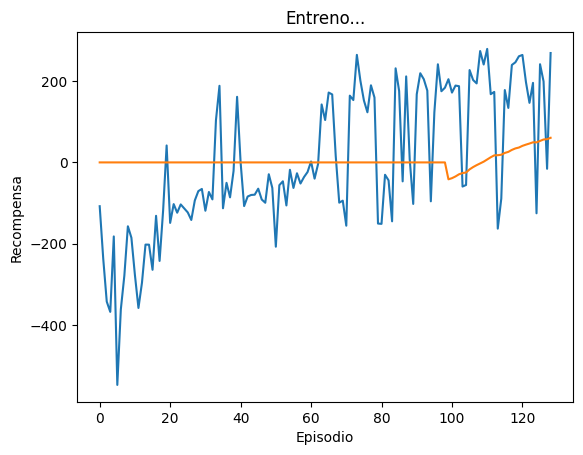

Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada:

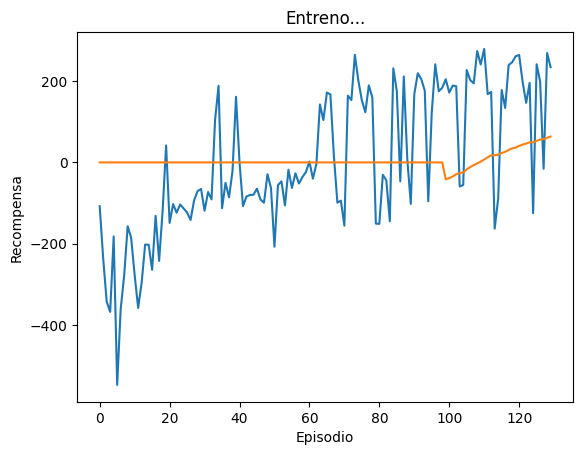

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

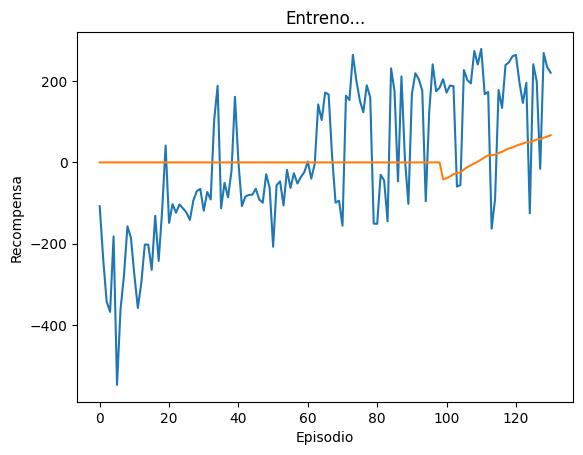

Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

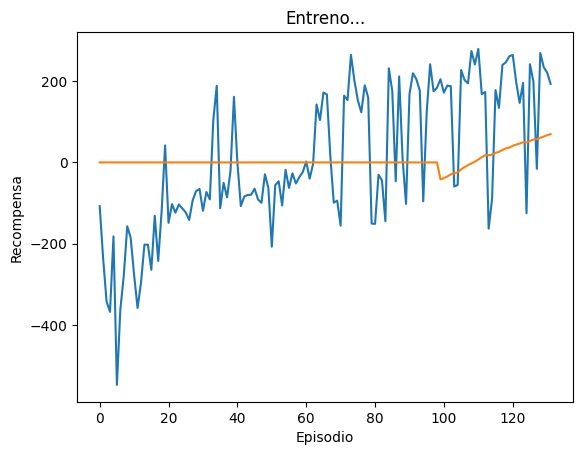

Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada:

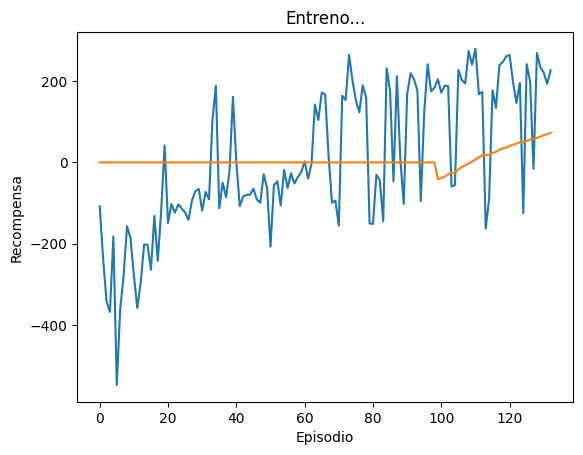

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada:

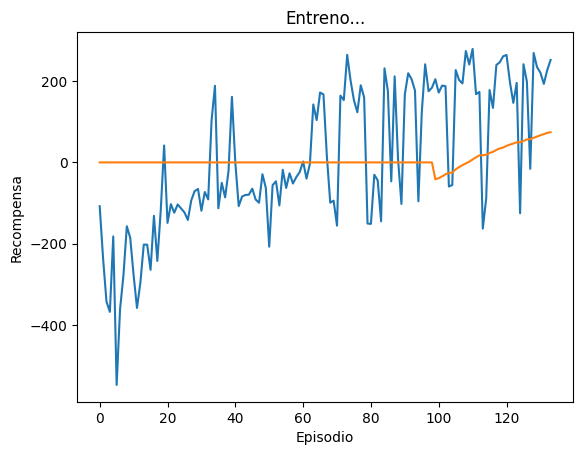

Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

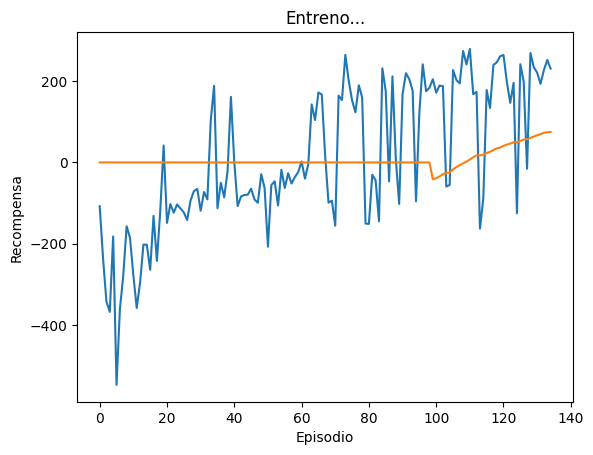

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

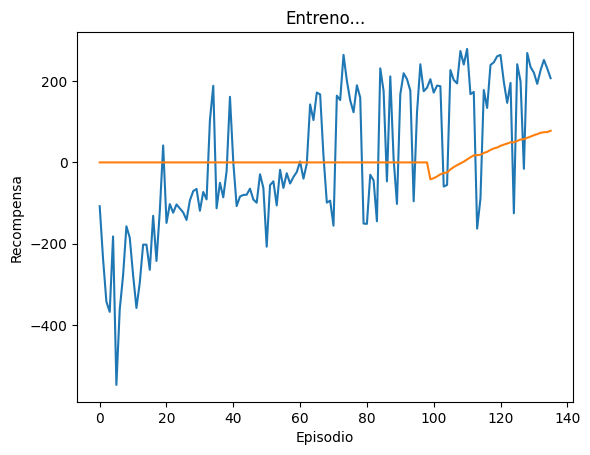

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

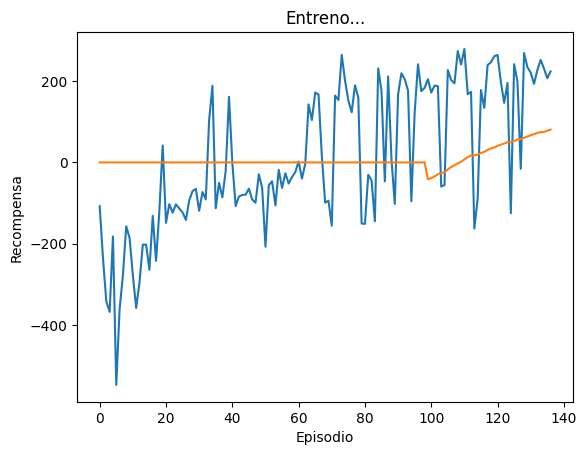

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

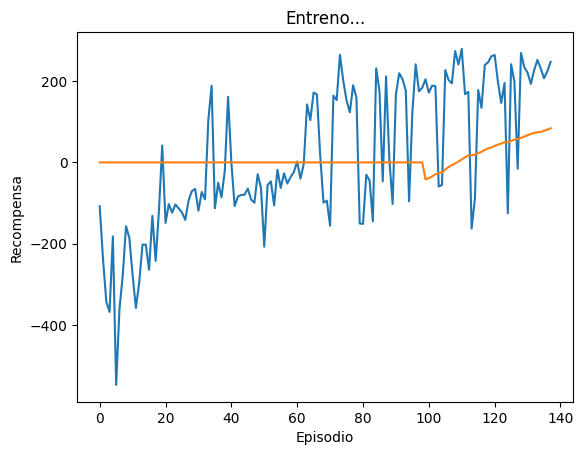

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

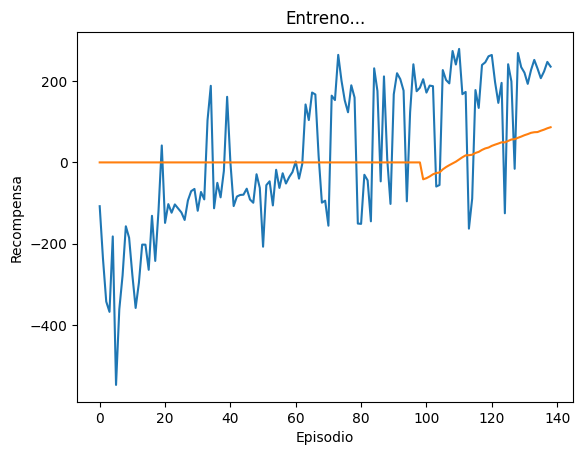

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada:

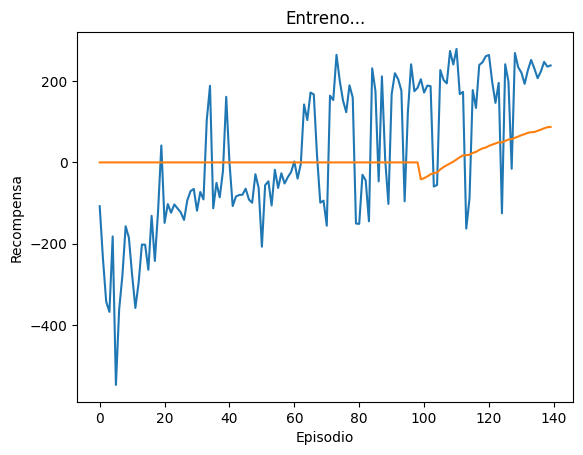

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

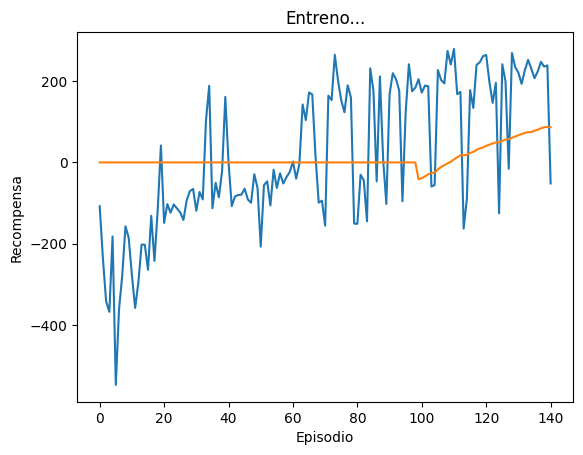

Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

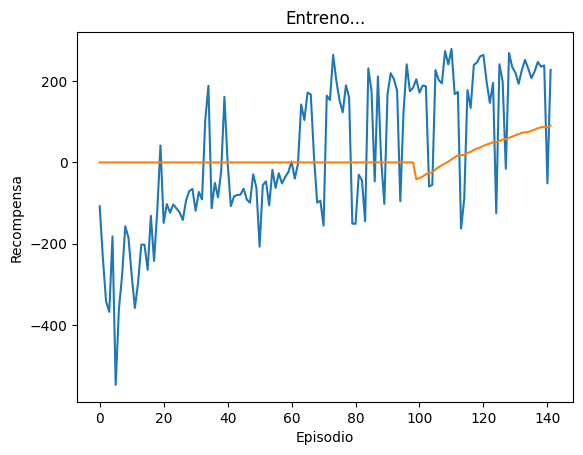

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

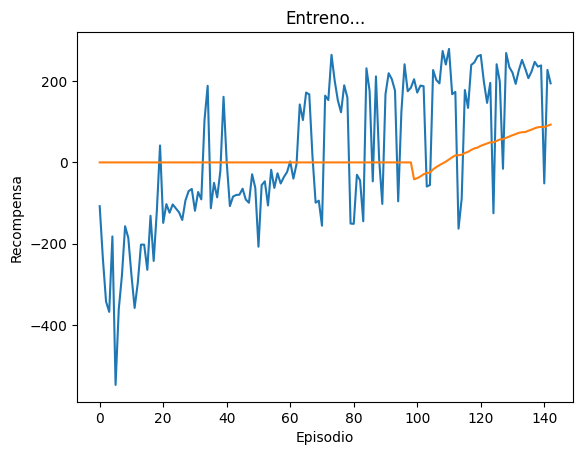

Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

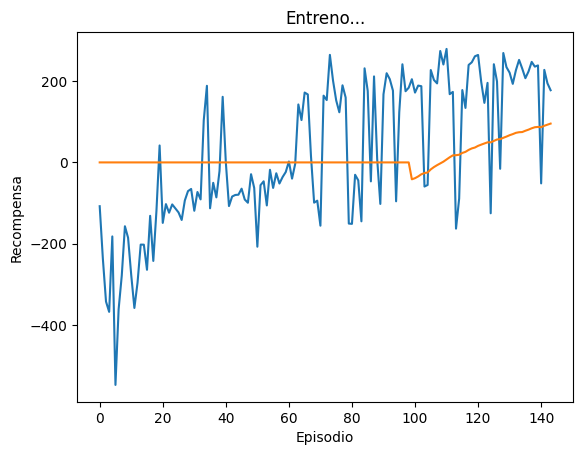

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

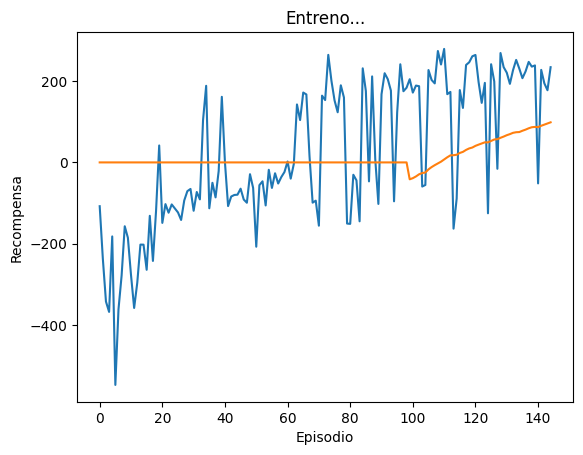

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

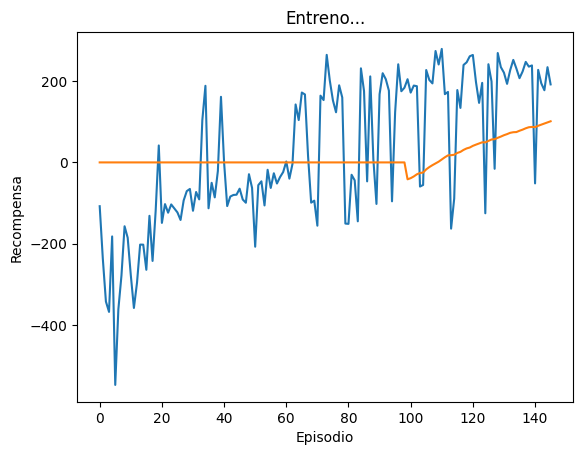

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada:

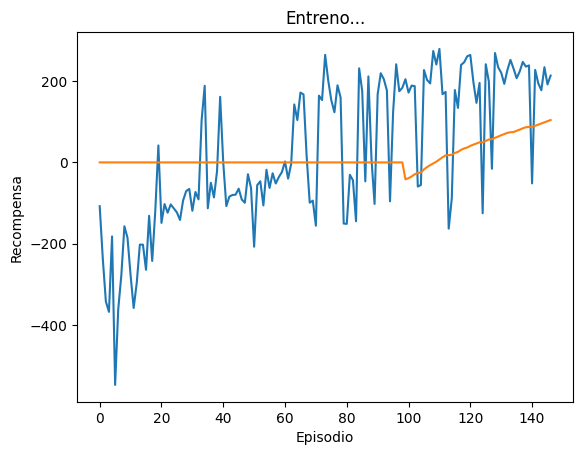

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

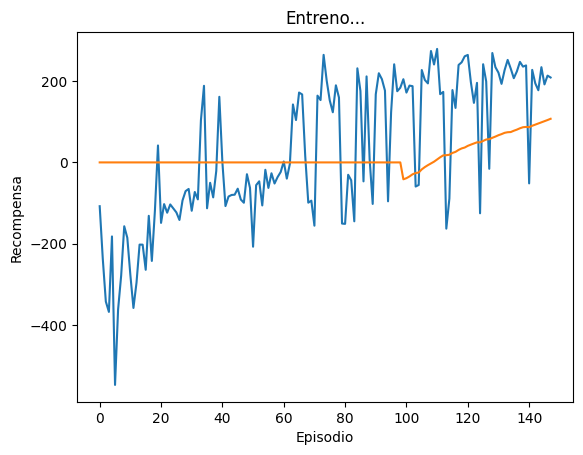

Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

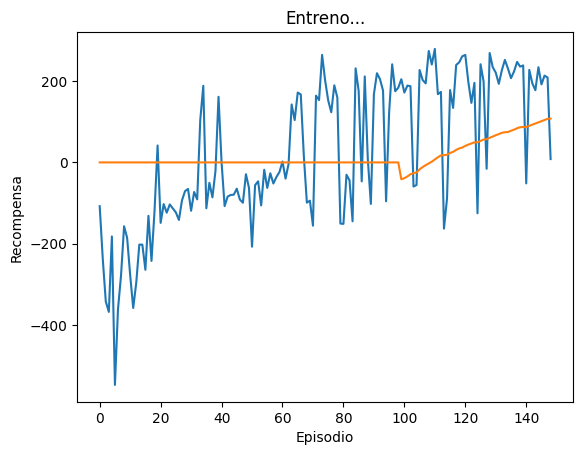

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

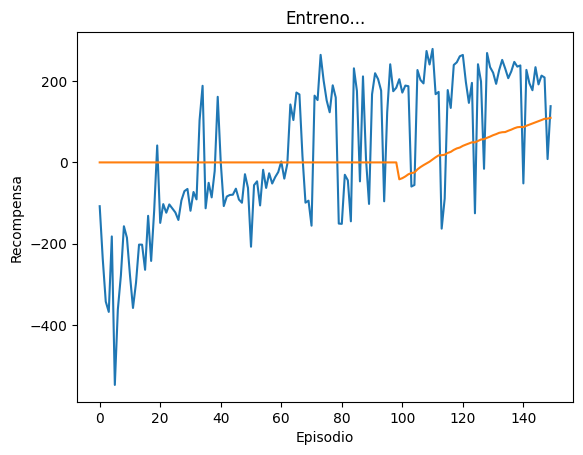

Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

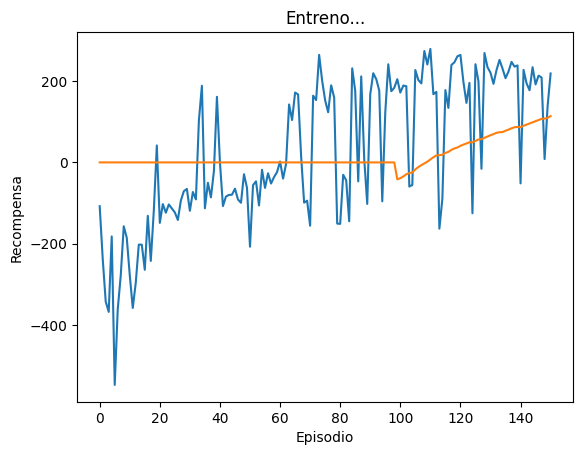

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

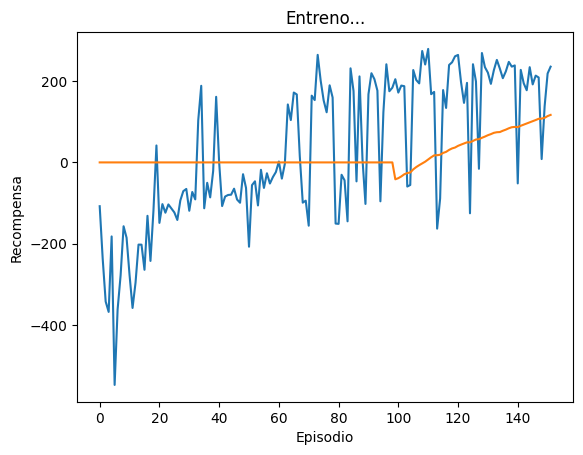

Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

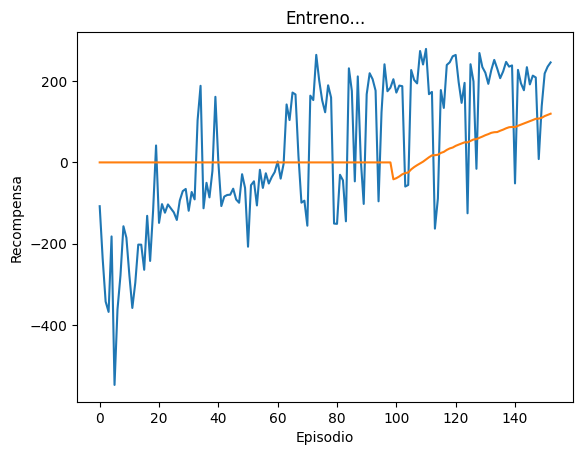

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada:

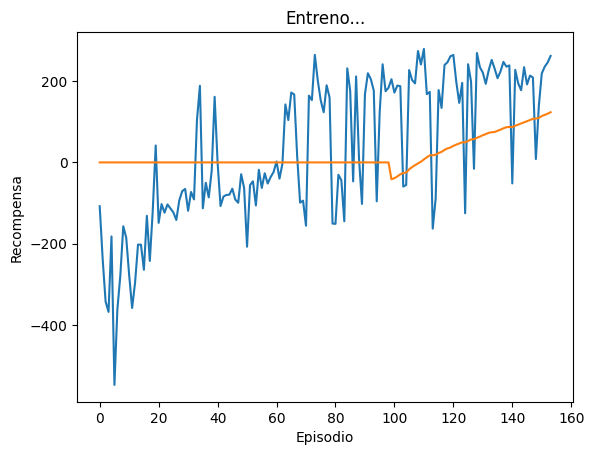

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada:

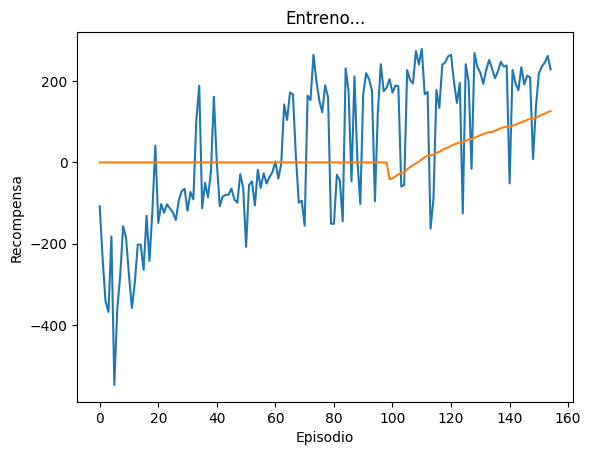

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada:

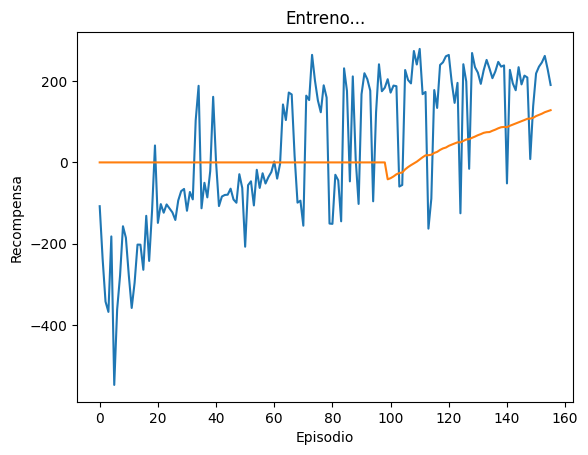

Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada:

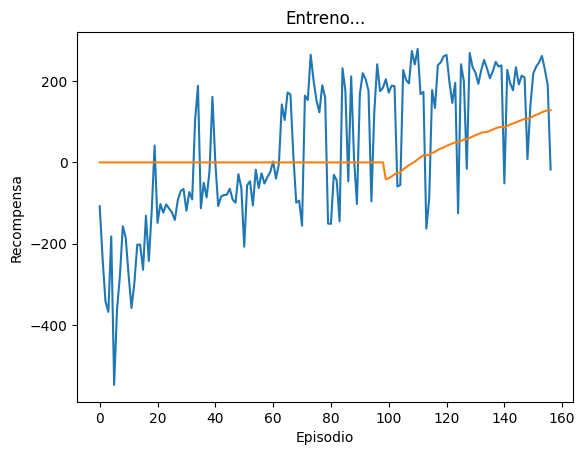

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

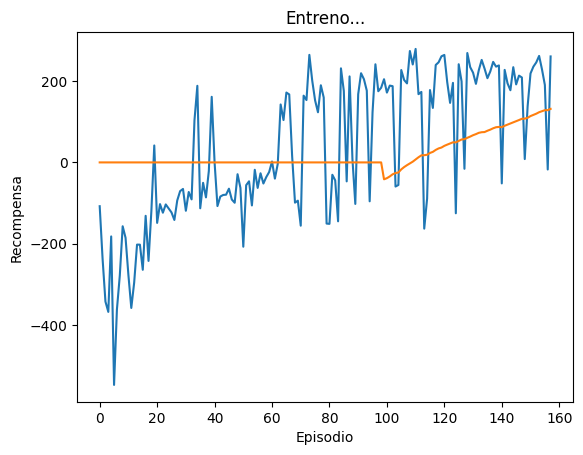

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

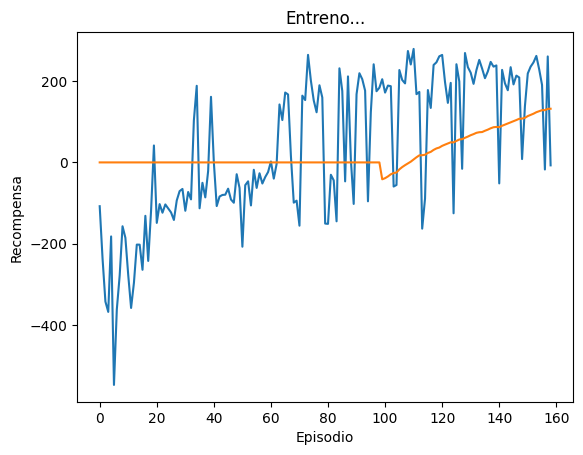

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

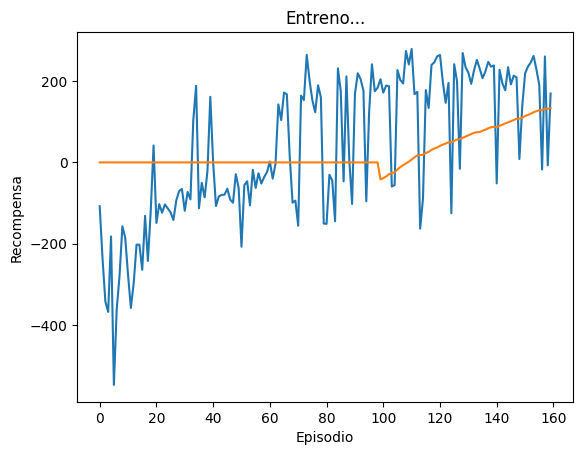

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada:

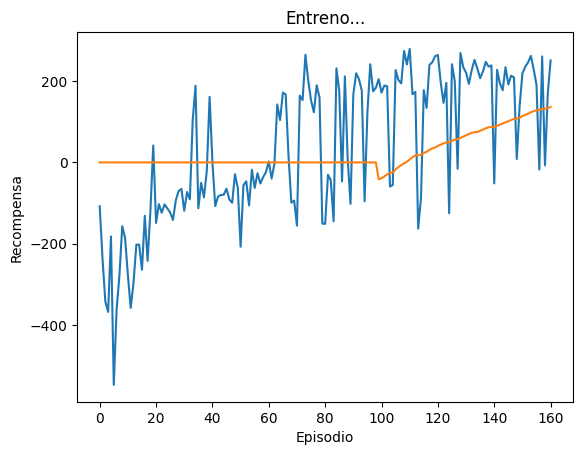

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

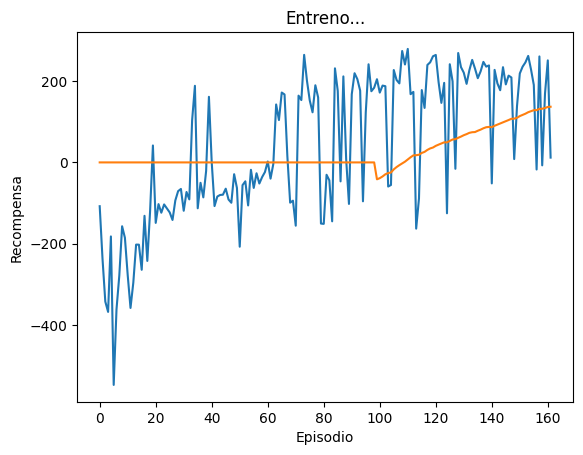

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

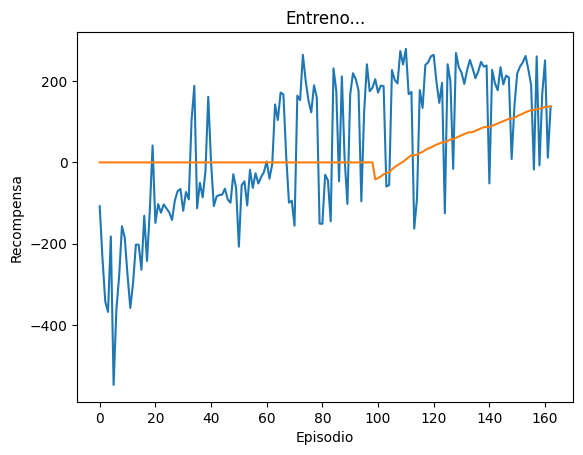

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

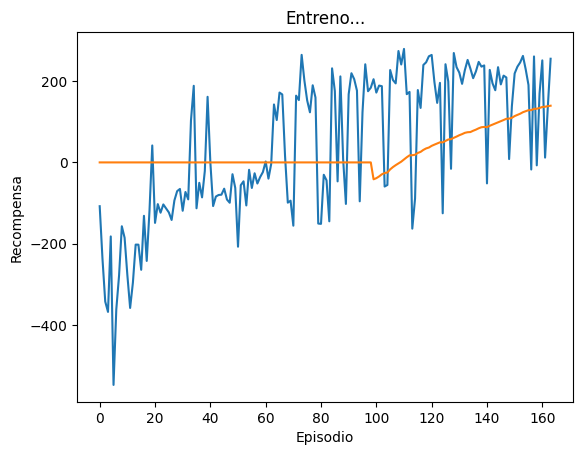

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

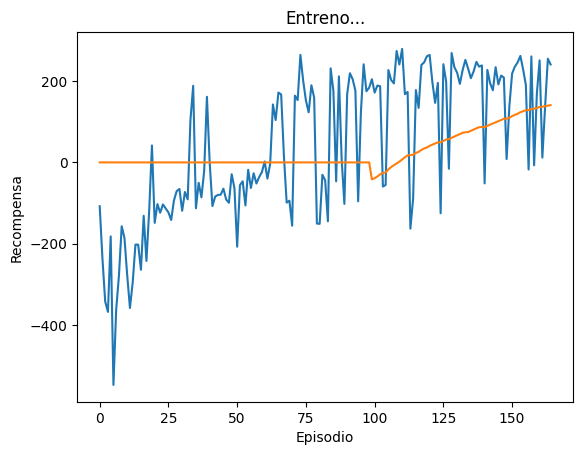

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

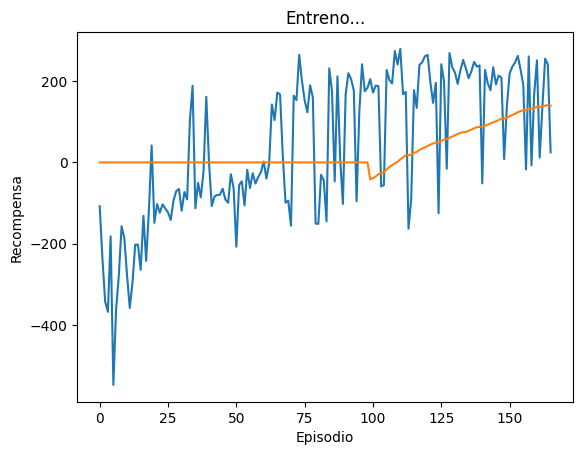

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada:

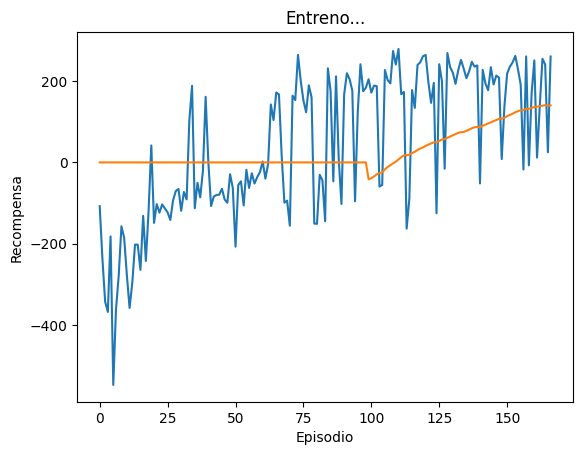

Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

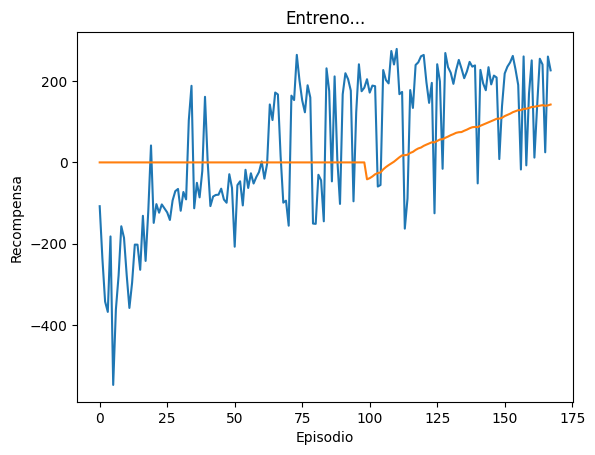

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

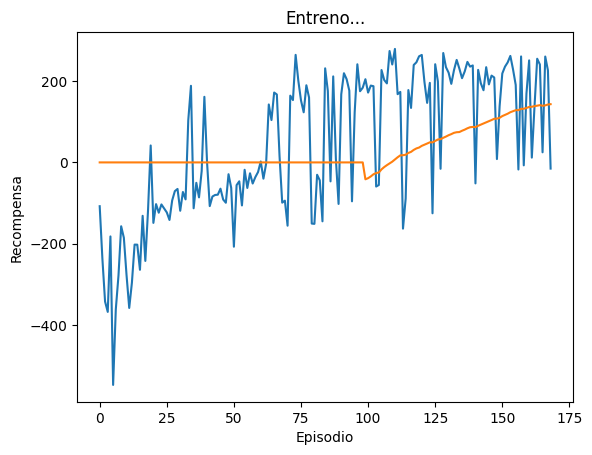

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

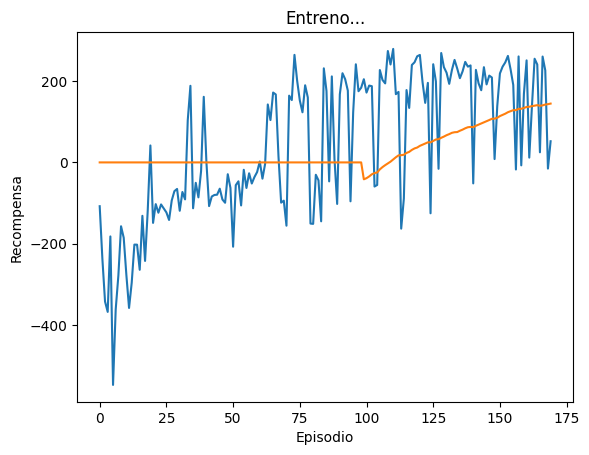

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada:

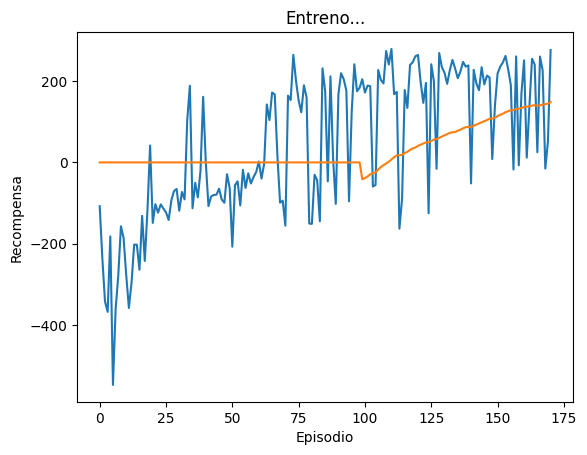

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

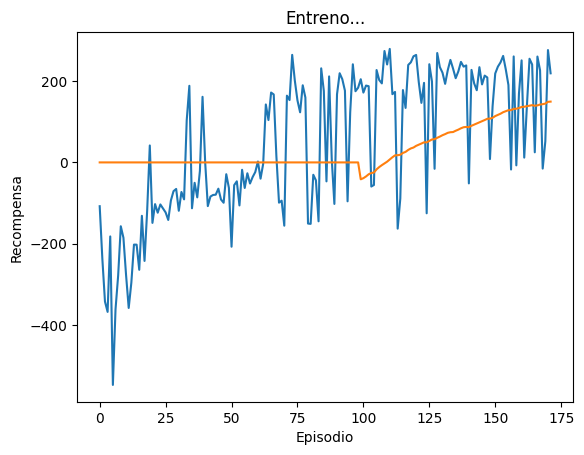

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

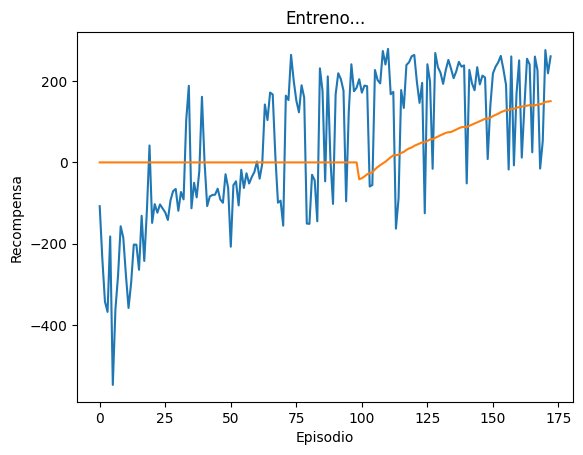

Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada:

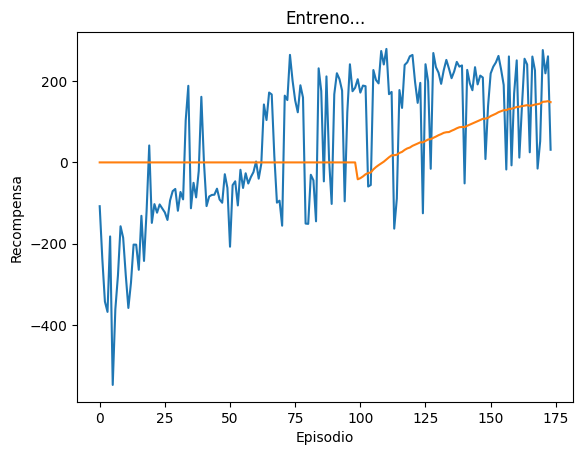

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada:

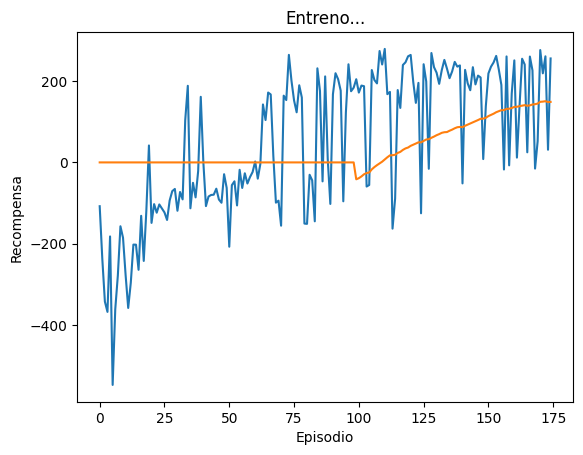

Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

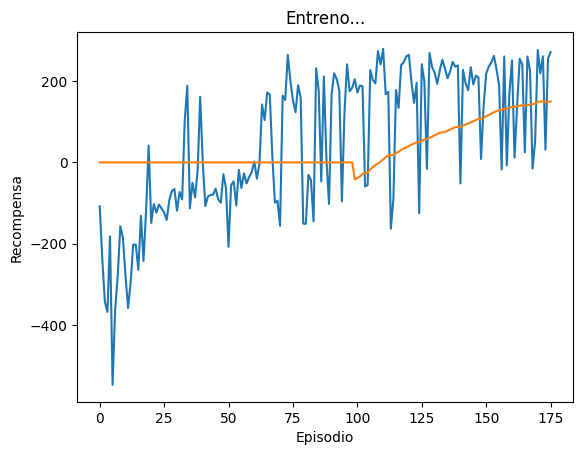

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada:

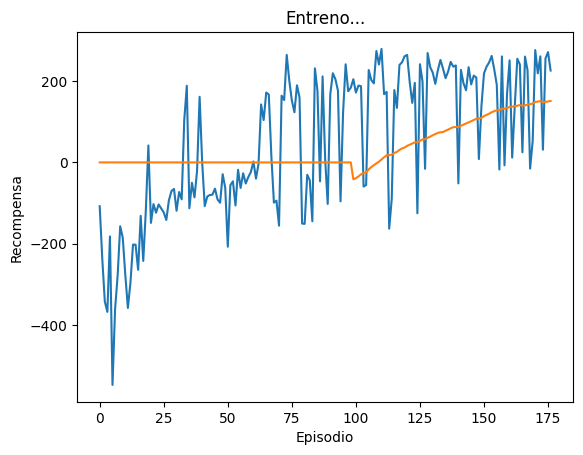

Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

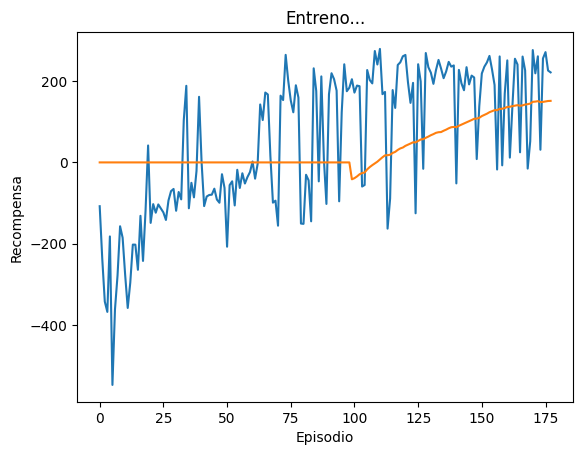

Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada:

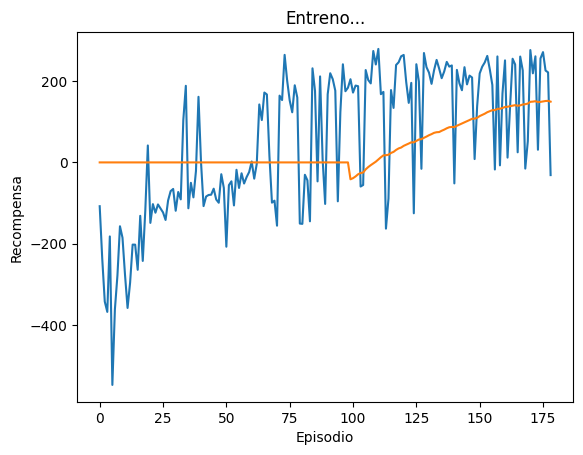

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada:

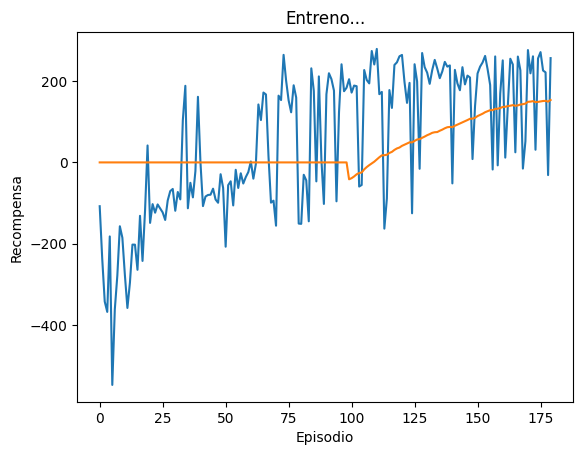

Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada:

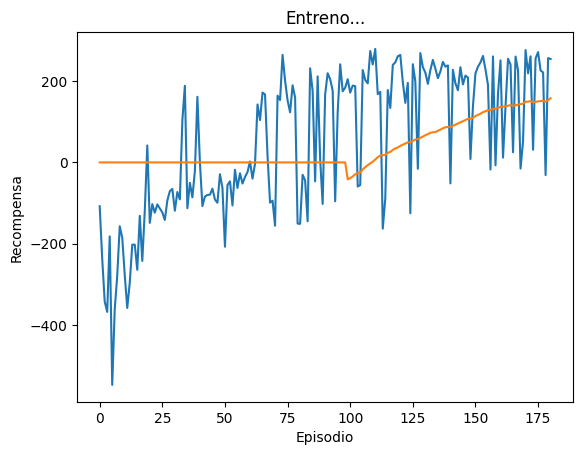

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada:

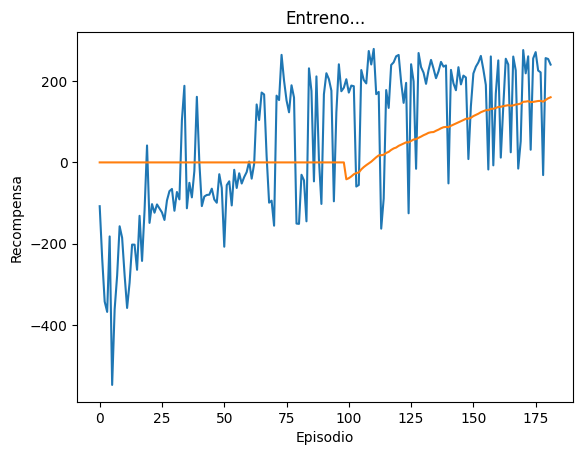

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

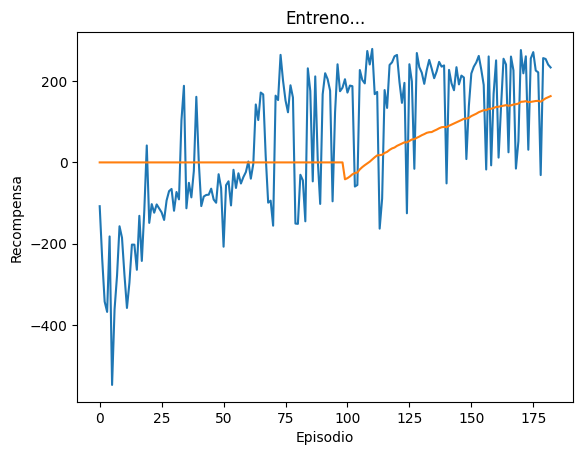

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada:

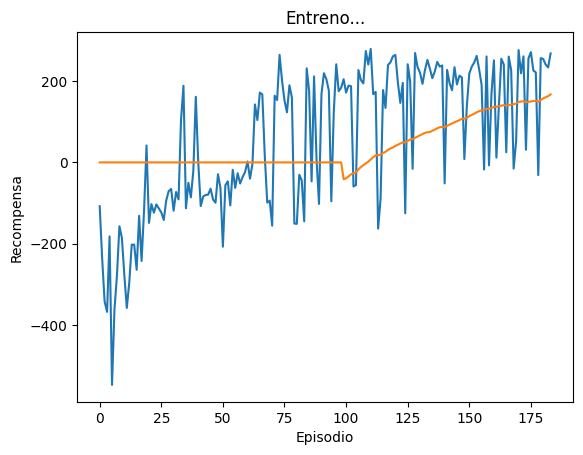

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

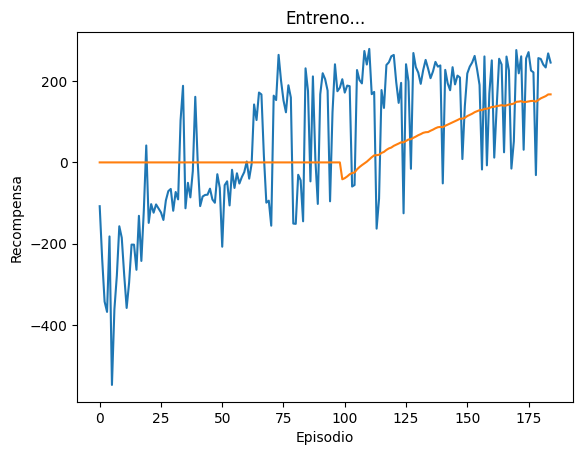

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada:

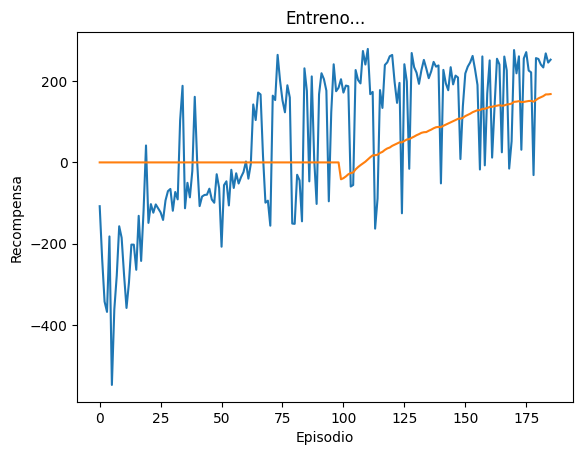

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

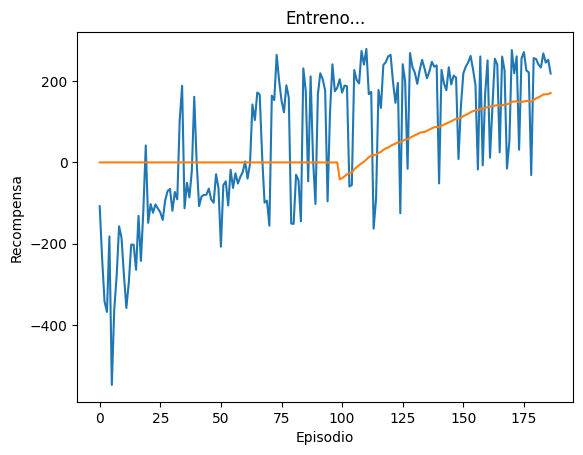

Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

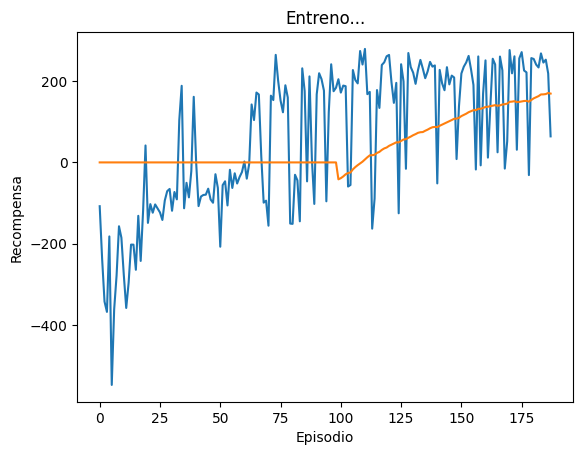

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada:

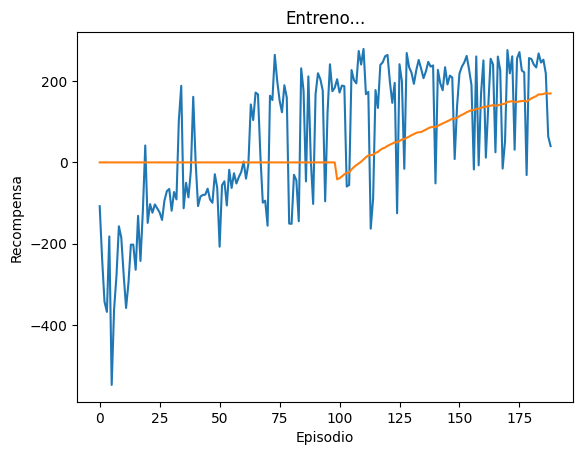

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada:

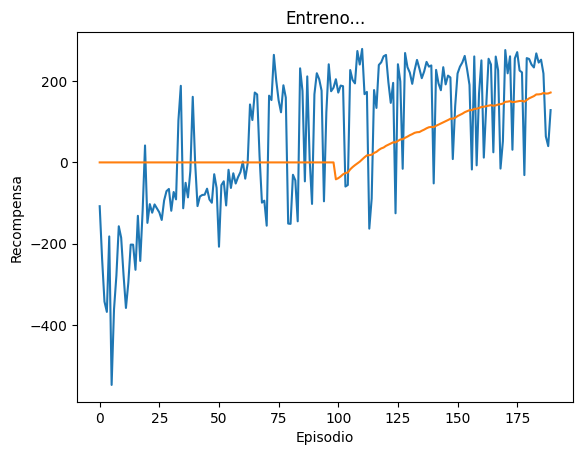

Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 3
Acción tomada:

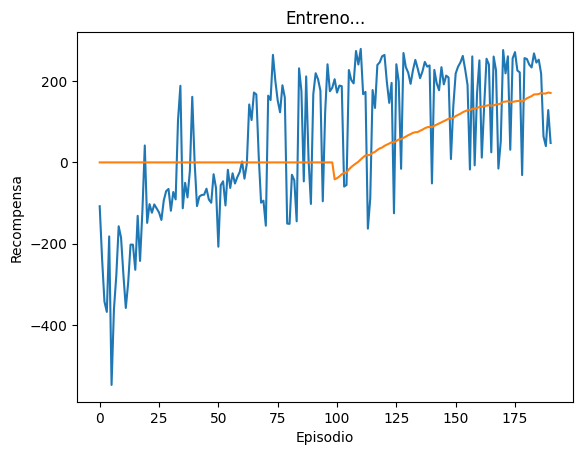

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada:

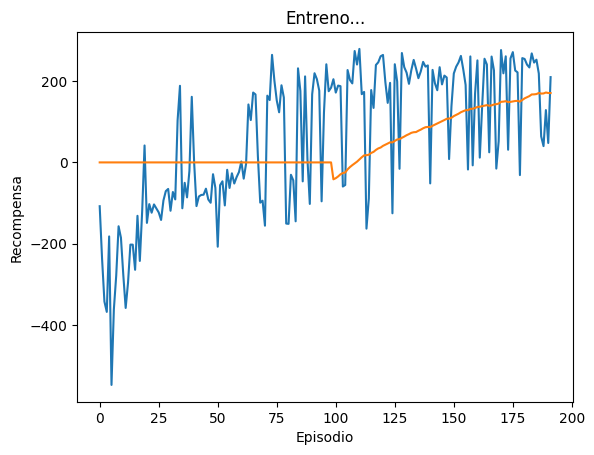

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

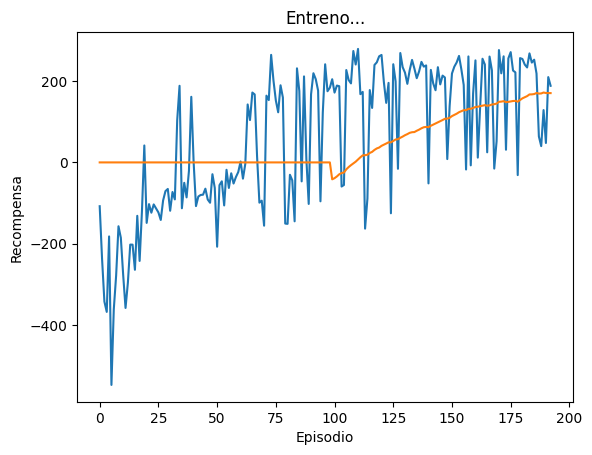

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

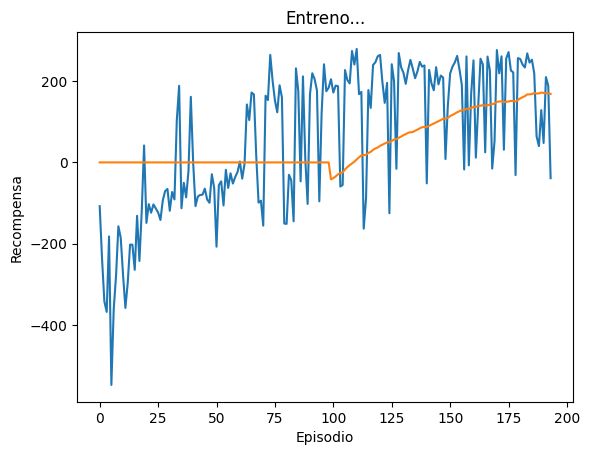

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada:

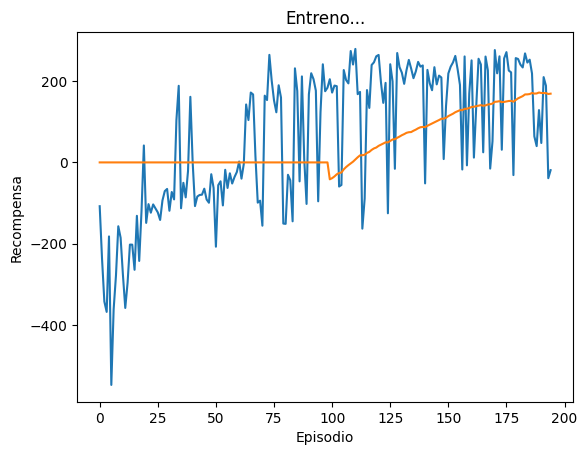

Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada:

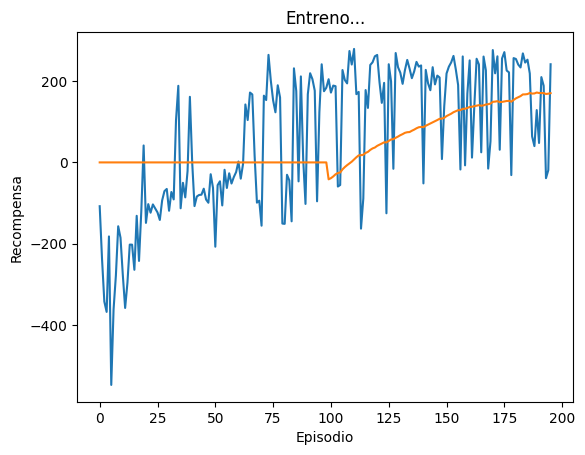

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 3
Acción tomada:

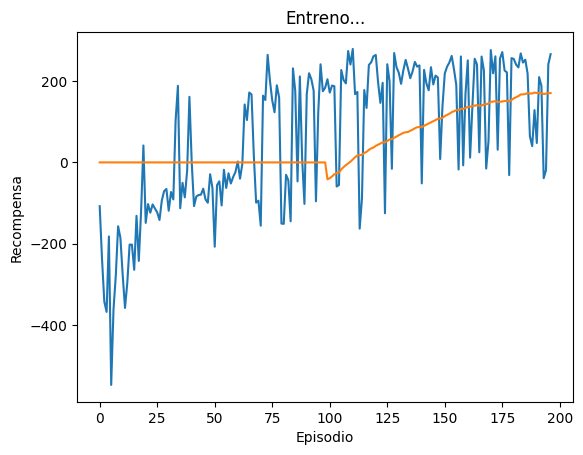

Acción tomada: 3
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 3
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 1
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada:

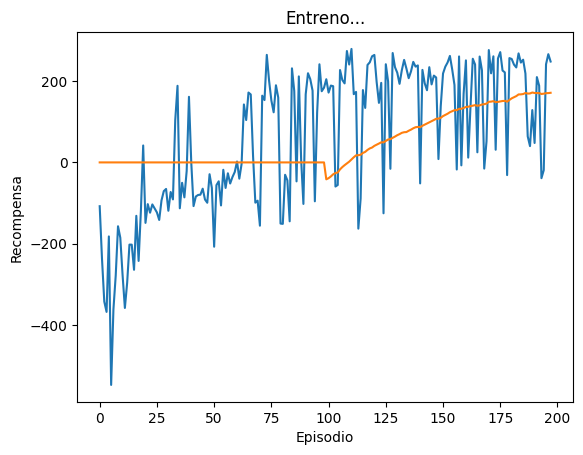

Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada:

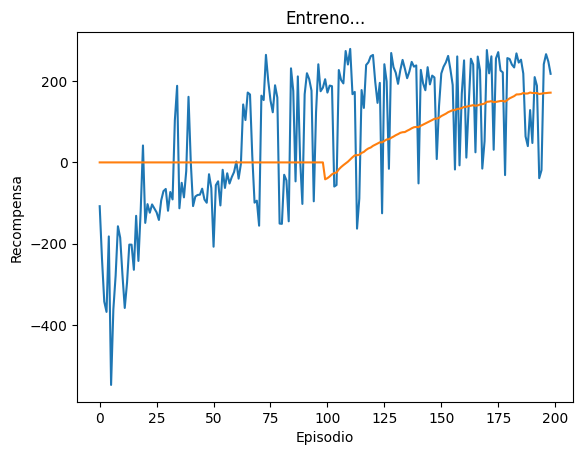

Acción tomada: 1
Acción tomada: 1
Acción tomada: 1
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 0
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 1
Acción tomada: 3
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 2
Acción tomada: 0
Acción tomada: 0
Acción tomada: 2
Acción tomada: 3
Acción tomada: 3
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 2
Acción tomada: 0
Acción tomada: 2
Acción tomada: 2
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 1
Acción tomada: 2
Acción tomada: 3
Acción tomada:

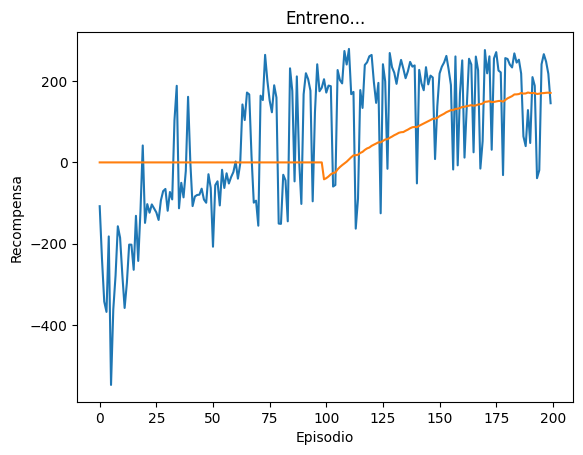

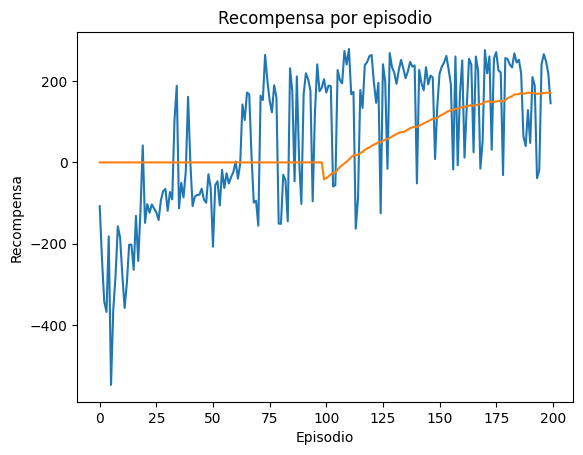

In [8]:

Transition = namedtuple('Transition', ('state', 'action', 'next_state', 'reward'))

#memoria de experiencia
class Memory:
    def __init__(self, capacity=10000):
        self.memory = deque(maxlen=capacity)  # Almacena hasta 'capacity' transiciones
        self.batch_size = 128  # Tamaño del lote para el entrenamiento

    def cache(self, *args):
        self.memory.append(Transition(*args))  # Guarda una transición (estado, acción, nuevo estado, recompensa)

    def recall(self):
        return random.sample(self.memory, self.batch_size)  # Obtiene un lote aleatorio de experiencias

    def __len__(self):
        return len(self.memory)


# Red 
class DQN(nn.Module):
    def __init__(self, num_observations, num_actions):
        super(DQN, self).__init__()
        self.layer1 = nn.Linear(num_observations, 128)
        self.layer2 = nn.Linear(128, 128)
        self.layer3 = nn.Linear(128, 128)
        self.layer4 = nn.Linear(128, num_actions)  

    def forward(self, x):
        x = fun.leaky_relu(self.layer1(x))
        x = fun.leaky_relu(self.layer2(x))
        x = fun.leaky_relu(self.layer3(x))
        return self.layer4(x)  
        #devuelve predicciones de valores Q para cada acción posible

# Hyperparametros (se controla la exploración/explotación, la tasa de aprendizaje y la actualización del target network)
BATCH_SIZE = 128
GAMMA = 0.99  # Factor de descuento para valorar recompensas futuras
EPS_START = 0.9
EPS_END = 0.05
EPS_DECAY = 1000  # Decaimiento de epsilon en la exploración
TAU = 0.001  # Parámetro para actualización suave de la red objetivo
LR = 1e-4  # Tasa de aprendizaje


# hay 2 redes
policy_net = DQN(num_observations, num_actions) #Red neuronal principal que se entrena
target_net = DQN(num_observations, num_actions) #Red auxiliar que ayuda a estabilizar el entrenamiento (actualizada con TAU).
target_net.load_state_dict(policy_net.state_dict()) # senicializa target_net con los mismos pesos de policy_net

optimizer = optim.AdamW(policy_net.parameters(), lr=LR, amsgrad=True)
memory = Memory()

steps = 0

# Se varía el uso de elegir acciones aleatorias o la de mayor recompensa
def act(state):
    global steps
    sample = random.random()
    eps_threshold = EPS_END + (EPS_START - EPS_END) * math.exp(-1. * steps / EPS_DECAY)
    steps += 1
    if sample > eps_threshold:
        with torch.no_grad():
            action = policy_net(state).max(1)[1].view(1, 1) #explotacion
    else:
        action = torch.tensor([[env.action_space.sample()]], dtype=torch.long) #exploracion
    
    print(f"Acción tomada: {action.item()}")  
    return action


episode_durations = []

def plot_durations(show_result=False):
    plt.figure(1)
    durations_t = torch.tensor(episode_durations, dtype=torch.float)
    if show_result:
        plt.title('Recompensa por episodio')
    else:
        plt.clf()
        plt.title('Entreno...')
    plt.xlabel('Episodio')
    plt.ylabel('Recompensa')
    plt.plot(durations_t.numpy())
    
    if len(durations_t) >= 100:
        means = durations_t.unfold(0, 100, 1).mean(1).view(-1)
        means = torch.cat((torch.zeros(99), means))
        plt.plot(means.numpy())

    plt.pause(0.001)  
    plt.show()


# Optimizar modelo
#Calcular valores q y comparar con valores actuales para actualizar red (eq bellman 'adaptada', ver diapositivas)
def optimize_model():
    if len(memory) < BATCH_SIZE:
        return
    transitions = memory.recall()

    batch = Transition(*zip(*transitions))

    non_final_mask = torch.tensor(tuple(map(lambda s: s is not None, batch.next_state)), dtype=torch.bool)
    non_final_next_states = torch.cat([s for s in batch.next_state if s is not None])
    state_batch = torch.cat(batch.state)
    action_batch = torch.cat(batch.action)
    reward_batch = torch.cat(batch.reward)

    state_action_values = policy_net(state_batch).gather(1, action_batch)

    next_state_values = torch.zeros(BATCH_SIZE)
    with torch.no_grad():
        next_state_values[non_final_mask] = target_net(non_final_next_states).max(1)[0]
    expected_state_action_values = (next_state_values * GAMMA) + reward_batch

    #usar regulación L1 que dijo el profe 
    criterion = nn.SmoothL1Loss()
    loss = criterion(state_action_values, expected_state_action_values.unsqueeze(1))

    optimizer.zero_grad()
    loss.backward()
    torch.nn.utils.clip_grad_value_(policy_net.parameters(), 100)
    optimizer.step()


#Entrenar
EPOCHS = 200

for i_episode in range(EPOCHS):
    reward_total = 0
    state, info = env.reset()
    state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)

    for t in count():
        action = act(state)
        observation, reward, terminated, truncated, _ = env.step(action.item())

        reward_total += reward
        reward = torch.tensor([reward])
        done = terminated or truncated

        if terminated:
            print("Episodio acabado con recompensa total:", reward_total)
            next_state = None
        else:
            next_state = torch.tensor(observation, dtype=torch.float32).unsqueeze(0)

        # Almacenar transición en memoria
        memory.cache(state, action, next_state, reward)

        # Actualizar estado
        state = next_state

        # Optimizar modelo en este estado
        optimize_model()

        # Actualizar target network
        target_net_state_dict = target_net.state_dict()
        policy_net_state_dict = policy_net.state_dict()
        for key in policy_net_state_dict:
            target_net_state_dict[key] = policy_net_state_dict[key] * TAU + target_net_state_dict[key] * (1 - TAU)
        target_net.load_state_dict(target_net_state_dict)

        if done:
            episode_durations.append(reward_total)
            plot_durations()
            break


plot_durations(show_result=True)
plt.ioff()
plt.show()
